# Face Generation

In this project, you'll define and train a DCGAN on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **loading in data to defining and training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset is more complex than the number datasets (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed_celeba_small/`

In [1]:
# can comment out after executing
!unzip processed_celeba_small.zip

Archive:  processed_celeba_small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [1]:
data_dir = 'processed_celeba_small/'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import pickle as pkl
import matplotlib.pyplot as plt
import numpy as np
import problem_unittests as tests


%matplotlib inline

## Visualize the CelebA Data

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA data.

> There are a few other steps that you'll need to **transform** this data and create a **DataLoader**.

#### Exercise: Complete the following `get_dataloader` function, such that it satisfies these requirements:

* Your images should be square, Tensor images of size `image_size x image_size` in the x and y dimension.
* Your function should return a DataLoader that shuffles and batches these Tensor images.

#### ImageFolder

To create a dataset given a directory of images, it's recommended that you use PyTorch's [ImageFolder](https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder) wrapper, with a root directory `processed_celeba_small/` and data transformation passed in.

In [2]:
import torch
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import transforms

In [3]:
def get_dataloader(batch_size, image_size, data_dir='processed_celeba_small/'):
    """
    Batch the neural network data using DataLoader
    :param batch_size: The size of each batch; the number of images in a batch
    :param img_size: The square size of the image data (x, y)
    :param data_dir: Directory where image data is located
    :return: DataLoader with batched data
    """   
    #transform = transforms.Compose([transforms.Resize(image_size,image_size)])
    #transform = transforms.ToTensor()
    transform = transforms.Compose([transforms.Resize(image_size), transforms.CenterCrop(image_size),transforms.ToTensor()])
    dataset_images = datasets.ImageFolder(data_dir,transform)
    dataloader = DataLoader(dataset=dataset_images, batch_size=batch_size,shuffle = True)
    
    #print("\nIt passed the get_dataloader function.\n")
    return dataloader


## Create a DataLoader

#### Exercise: Create a DataLoader `celeba_train_loader` with appropriate hyperparameters.

Call the above function and create a dataloader to view images. 
* You can decide on any reasonable `batch_size` parameter
* Your `image_size` **must be** `32`. Resizing the data to a smaller size will make for faster training, while still creating convincing images of faces!

In [4]:
# Define function hyperparameters
#batch_size = 128
batch_size = 32
img_size = 32

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Call your function and get a dataloader
celeba_train_loader = get_dataloader(batch_size, img_size)


Next, you can view some images! You should seen square images of somewhat-centered faces.

Note: You'll need to convert the Tensor images into a NumPy type and transpose the dimensions to correctly display an image, suggested `imshow` code is below, but it may not be perfect.

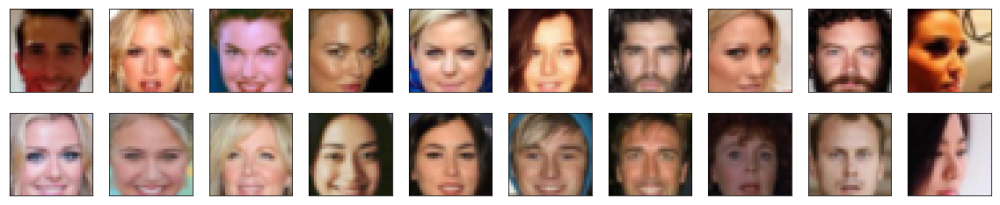

In [5]:
# helper display function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# obtain one batch of training images
dataiter = iter(celeba_train_loader)
images, _ = dataiter.next() # _ for no labels

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, plot_size/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])

#### Exercise: Pre-process your image data and scale it to a pixel range of -1 to 1

You need to do a bit of pre-processing; you know that the output of a `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. (Right now, they are in a range from 0-1.)

In [6]:
# check current range of images before pre-processing
img = images[0]

print('Min: ', img.min())
print('Max: ', img.max())

Min:  tensor(0.)
Max:  tensor(0.8706)


In [7]:
# TODO: Complete the scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x      
    min, max = feature_range
    x = x * (max - min) + min    
    #print("\nIt passed the scale function.\n")
    
    return x

In [8]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# check scaled range
# should be close to -1 to 1
img = images[0]
scaled_img = scale(img)

print('Min: ', scaled_img.min())
print('Max: ', scaled_img.max())

Min:  tensor(-1.)
Max:  tensor(0.7412)


---
# Define the Model

A GAN is comprised of two adversarial networks, a discriminator and a generator.

## Discriminator

Your first task will be to define the discriminator. This is a convolutional classifier like you've built before, only without any maxpooling layers. To deal with this complex data, it's suggested you use a deep network with **normalization**. You are also allowed to create any helper functions that may be useful.

#### Exercise: Complete the Discriminator class
* The inputs to the discriminator are 32x32x3 tensor images
* The output should be a single value that will indicate whether a given image is real or fake


In [9]:
import torch.nn as nn
import torch.nn.functional as F

In [11]:
# helper conv function
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []   
    
    conv_layer = nn.Conv2d(in_channels=in_channels , out_channels=out_channels, 
                           kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    
    # append conv layer
    layers.append(conv_layer)

    if batch_norm:
        # append batchnorm layer
        layers.append(nn.BatchNorm2d(out_channels))
     
    # using Sequential container
    return nn.Sequential(*layers)


In [12]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim):
        """
        Initialize the Discriminator Module
        :param conv_dim: The depth of the first convolutional layer
        """
        super(Discriminator, self).__init__()        
        self.conv_dim = conv_dim
        # 32x32 input
        self.conv1 = conv(3, conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 16x16 out
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        # 8x8 out
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        # 4x4 out        
        # final, fully-connected layer
        self.fc = nn.Linear(conv_dim*4*4*4, 1)
        self.out = nn.Sigmoid()
        self.dropout = nn.Dropout(0.3)        
        #print("\nIt passed the init function in the discriminator.\n")  
        
      

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """       
        # all hidden layers + leaky relu activation
        out = F.leaky_relu(self.conv1(x), 0.2)
        out = F.leaky_relu(self.conv2(out), 0.2)
        out = F.leaky_relu(self.conv3(out), 0.2)
        
        # flatten
        out = out.view(-1, self.conv_dim*4*4*4)
        
        # final output layer
        out = self.fc(out)
        out = self.dropout(out)
        
        #print("\nIt passed the forward function in the discriminator.\n")
        return out
        #return x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(Discriminator)

Tests Passed


## Generator

The generator should upsample an input and generate a *new* image of the same size as our training data `32x32x3`. This should be mostly transpose convolutional layers with normalization applied to the outputs.

#### Exercise: Complete the Generator class
* The inputs to the generator are vectors of some length `z_size`
* The output should be a image of shape `32x32x3`

In [13]:
# helper deconv function
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a transposed-convolutional layer, with optional batch normalization.
    """
    # create a sequence of transpose + optional batch norm layers
    layers = []   
    
    # append transpose conv layer
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    if batch_norm:
        # append batchnorm layer
        layers.append(nn.BatchNorm2d(out_channels))
        
    return nn.Sequential(*layers)

In [14]:
class Generator(nn.Module):
    
    def __init__(self, z_size, conv_dim):
        """
        Initialize the Generator Module
        :param z_size: The length of the input latent vector, z
        :param conv_dim: The depth of the inputs to the *last* transpose convolutional layer
        """
        super(Generator, self).__init__()
        
        self.conv_dim = conv_dim
        
        # first, fully-connected layer
        self.fc = nn.Linear(z_size, conv_dim*4*4*4)

        # transpose conv layers
        self.t_conv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.t_conv2 = deconv(conv_dim*2, conv_dim, 4)
        self.t_conv3 = deconv(conv_dim, 3, 4, batch_norm=False)
        
        # Dropout layer
        self.dropout = nn.Dropout(0.5)
        
        #print("\nIt passed the init function in the Generator.\n")
        

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 32x32x3 Tensor image as output
        """
        # define feedforward behavior       
        # fully-connected + reshape 
        out = self.fc(x)
        out = self.dropout(out)
        out = out.view(-1, self.conv_dim*4, 4, 4) # (batch_size, depth, 4, 4)
        
        # hidden transpose conv layers + relu
        out = F.relu(self.t_conv1(out))
        out = F.relu(self.t_conv2(out))
        
        # last layer + tanh activation
        #out = self.t_conv3(out)
        #out = F.tanh(out)
        
        out = F.tanh(self.t_conv3(out))
        
        #print("\nIt passed the forward function in the Generator.\n")
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(Generator)

Tests Passed


## Initialize the weights of your networks

To help your models converge, you should initialize the weights of the convolutional and linear layers in your model. From reading the [original DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf), they say:
> All weights were initialized from a zero-centered Normal distribution with standard deviation 0.02.

So, your next task will be to define a weight initialization function that does just this!

You can refer back to the lesson on weight initialization or even consult existing model code, such as that from [the `networks.py` file in CycleGAN Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/models/networks.py) to help you complete this function.

#### Exercise: Complete the weight initialization function

* This should initialize only **convolutional** and **linear** layers
* Initialize the weights to a normal distribution, centered around 0, with a standard deviation of 0.02.
* The bias terms, if they exist, may be left alone or set to 0.

In [15]:
def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model .
    The weights are taken from a normal distribution 
    with mean = 0, std dev = 0.02.
    :param m: A module or layer in a network    
    """
    # classname will be something like:
    # `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__
            
    if hasattr(m, 'weight') and (classname.find('Conv') or classname.find('Linear') != -1):
        m.weight.data.normal_(0.0, 0.02)
        m.bias.data.fill_(0)   

## Build complete network

Define your models' hyperparameters and instantiate the discriminator and generator from the classes defined above. Make sure you've passed in the correct input arguments.

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
def build_network(d_conv_dim, g_conv_dim, z_size):
    # define discriminator and generator
    D = Discriminator(d_conv_dim)
    G = Generator(z_size=z_size, conv_dim=g_conv_dim)

    # initialize model weights
    D.apply(weights_init_normal)
    G.apply(weights_init_normal)

    print(D)
    print()
    print(G)
    
    return D, G


#### Exercise: Define model hyperparameters

In [17]:
# Define model hyperparams
#d_conv_dim = 32
#g_conv_dim = 32
#d_conv_dim = 20
#g_conv_dim = 20
#z_size = 120

#d_conv_dim = 64
#g_conv_dim = 64
#z_size = 100

#d_conv_dim = 128
#g_conv_dim = 128
#z_size = 150

d_conv_dim = 64
g_conv_dim = 64
z_size = 150


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
D, G = build_network(d_conv_dim, g_conv_dim, z_size)

Discriminator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (fc): Linear(in_features=4096, out_features=1, bias=True)
  (out): Sigmoid()
  (dropout): Dropout(p=0.3)
)

Generator(
  (fc): Linear(in_features=150, out_features=4096, bias=True)
  (t_conv1): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (t_conv2): Sequential(
    (0): ConvTranspose2d(128, 64, ke

### Training on GPU

Check if you can train on GPU. Here, we'll set this as a boolean variable `train_on_gpu`. Later, you'll be responsible for making sure that 
>* Models,
* Model inputs, and
* Loss function arguments

Are moved to GPU, where appropriate.

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Training on GPU!')

Training on GPU!


---
## Discriminator and Generator Losses

Now we need to calculate the losses for both types of adversarial networks.

### Discriminator Losses

> * For the discriminator, the total loss is the sum of the losses for real and fake images, `d_loss = d_real_loss + d_fake_loss`. 
* Remember that we want the discriminator to output 1 for real images and 0 for fake images, so we need to set up the losses to reflect that.


### Generator Loss

The generator loss will look similar only with flipped labels. The generator's goal is to get the discriminator to *think* its generated images are *real*.

#### Exercise: Complete real and fake loss functions

**You may choose to use either cross entropy or a least squares error loss to complete the following `real_loss` and `fake_loss` functions.**

In [19]:
def real_loss(D_out,smooth = False):
    '''Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss'''
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    #print("\nIt passed the real_loss function.\n")
    return loss
    

def fake_loss(D_out):
    '''Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss'''
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    #print("\nIt passed the fake_loss function.\n")
    return loss   

## Optimizers

#### Exercise: Define optimizers for your Discriminator (D) and Generator (G)

Define optimizers for your models with appropriate hyperparameters.

In [20]:
import torch.optim as optim

# Create optimizers for the discriminator D and generator G
# params
#lr = 0.00002
#beta1=0.5
#beta2=0.999 # default value

# params
#lr = 0.0002
#lr = 0.0003
lr = 0.0001
#beta1=0.5
beta1=0.1
beta2=0.999 # default value

# Create optimizers for the discriminator and generator
d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

---
## Training

Training will involve alternating between training the discriminator and the generator. You'll use your functions `real_loss` and `fake_loss` to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function


#### Saving Samples

You've been given some code to print out some loss statistics and save some generated "fake" samples.

#### Exercise: Complete the training function

Keep in mind that, if you've moved your models to GPU, you'll also have to move any model inputs to GPU.

In [21]:
import torchvision
import pickle as pkl

def train(D, G, n_epochs, print_every=50):
    '''Trains adversarial networks for some number of epochs
       param, D: the discriminator network
       param, G: the generator network
       param, n_epochs: number of epochs to train for
       param, print_every: when to print and record the models' losses
       return: D and G losses'''
    
    # move models to GPU
    if train_on_gpu:
        D.cuda()
        G.cuda()

    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []

    # Get some fixed data for sampling. These are images that are held
    # constant throughout training, and allow us to inspect the model's performance
    sample_size=16
    fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
    fixed_z = torch.from_numpy(fixed_z).float()
    # move z to GPU if available
    if train_on_gpu:
        fixed_z = fixed_z.cuda()

    # epoch training loop
    for epoch in range(n_epochs):
        # batch training loop
        for batch_i, (real_images, _) in enumerate(celeba_train_loader):
            batch_size = real_images.size(0)
            real_images = scale(real_images)

            # ===============================================
            #         YOUR CODE HERE: TRAIN THE NETWORKS
            # ===============================================
            
            # 1. Train the discriminator on real and fake images
            d_optimizer.zero_grad()
            
            ## Train with real images ##
            # Compute the discriminator losses on real images 
            if train_on_gpu:
                real_images = real_images.cuda()
        
            D_real = D(real_images)
            d_real_loss = real_loss(D_real)
        
            ## Train with fake images ##
        
            # Generate fake images   
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            
            # move x to GPU, if available
            if train_on_gpu:
                z = z.cuda()
            fake_images = G(z)
        
            # Compute the discriminator losses on fake images            
            D_fake = D(fake_images)
            d_fake_loss = fake_loss(D_fake)
        
            # add up loss and perform backprop
            d_loss = d_real_loss + d_fake_loss
            d_loss.backward()
            d_optimizer.step()

            # 2. Train the generator with an adversarial loss
            g_optimizer.zero_grad()

            # Generate fake images
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            if train_on_gpu:
                z = z.cuda()
            fake_images = G(z)
        
            # Compute the discriminator losses on fake images 
            # using flipped labels!
            D_fake = D(fake_images)
            g_loss = real_loss(D_fake) # use real loss to flip labels
        
            # perform backprop
            g_loss.backward()
            g_optimizer.step()           
            
            
            # ===============================================
            #              END OF YOUR CODE
            # ===============================================

            # Print some loss stats
            if batch_i % print_every == 0:
                # append discriminator loss and generator loss
                losses.append((d_loss.item(), g_loss.item()))
                # print discriminator and generator loss
                print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                        epoch+1, n_epochs, d_loss.item(), g_loss.item()))


        ## AFTER EACH EPOCH##    
        # this code assumes your generator is named G, feel free to change the name
        # generate and save sample, fake images
        G.eval() # for generating samples
        if train_on_gpu:
            fixed_z = fixed_z.cuda()
        samples_z = G(fixed_z)
        samples.append(samples_z)
              
       
        
        ########################################################################
        img = torchvision.utils.make_grid(samples_z)
        img = img.cpu().detach().numpy()
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        plt.figure(figsize = (12,10))
        plt.imshow(np.transpose(img, (1,2,0)))
        plt.axis('off')
        plt.show()
        ########################################################################        
        
        G.train() # back to training mode 
        

    # Save training generator samples
    with open('train_samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    # finally return losses
    return losses

Set your number of training epochs and train your GAN!

Epoch [    1/   25] | d_loss: 1.3846 | g_loss: 0.6898
Epoch [    1/   25] | d_loss: 0.8580 | g_loss: 0.9820
Epoch [    1/   25] | d_loss: 0.6535 | g_loss: 1.6803
Epoch [    1/   25] | d_loss: 0.5210 | g_loss: 1.8247
Epoch [    1/   25] | d_loss: 0.8497 | g_loss: 1.1900
Epoch [    1/   25] | d_loss: 0.6894 | g_loss: 1.4824
Epoch [    1/   25] | d_loss: 0.6398 | g_loss: 1.6185
Epoch [    1/   25] | d_loss: 0.7276 | g_loss: 1.4523
Epoch [    1/   25] | d_loss: 0.8026 | g_loss: 1.1521
Epoch [    1/   25] | d_loss: 0.8815 | g_loss: 1.7601
Epoch [    1/   25] | d_loss: 0.7812 | g_loss: 1.8060
Epoch [    1/   25] | d_loss: 1.0149 | g_loss: 2.5725
Epoch [    1/   25] | d_loss: 0.8167 | g_loss: 1.0558
Epoch [    1/   25] | d_loss: 0.8699 | g_loss: 1.3567
Epoch [    1/   25] | d_loss: 1.1142 | g_loss: 1.9123
Epoch [    1/   25] | d_loss: 1.1150 | g_loss: 1.8742
Epoch [    1/   25] | d_loss: 1.2330 | g_loss: 0.7304
Epoch [    1/   25] | d_loss: 0.9138 | g_loss: 1.1582
Epoch [    1/   25] | d_loss

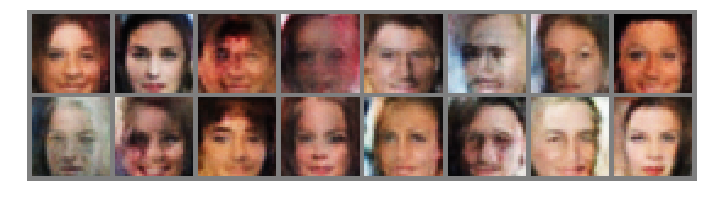

Epoch [    2/   25] | d_loss: 1.1976 | g_loss: 1.0422
Epoch [    2/   25] | d_loss: 1.1150 | g_loss: 1.0039
Epoch [    2/   25] | d_loss: 1.0252 | g_loss: 1.2166
Epoch [    2/   25] | d_loss: 1.1840 | g_loss: 0.9985
Epoch [    2/   25] | d_loss: 1.0967 | g_loss: 1.0846
Epoch [    2/   25] | d_loss: 1.1359 | g_loss: 1.1799
Epoch [    2/   25] | d_loss: 0.9552 | g_loss: 0.7720
Epoch [    2/   25] | d_loss: 1.0823 | g_loss: 1.0656
Epoch [    2/   25] | d_loss: 1.1439 | g_loss: 1.1519
Epoch [    2/   25] | d_loss: 1.0338 | g_loss: 1.0936
Epoch [    2/   25] | d_loss: 1.3576 | g_loss: 0.6542
Epoch [    2/   25] | d_loss: 1.0631 | g_loss: 1.1391
Epoch [    2/   25] | d_loss: 1.1663 | g_loss: 0.9160
Epoch [    2/   25] | d_loss: 1.1659 | g_loss: 0.8627
Epoch [    2/   25] | d_loss: 1.0636 | g_loss: 1.0750
Epoch [    2/   25] | d_loss: 1.1419 | g_loss: 1.5083
Epoch [    2/   25] | d_loss: 1.2097 | g_loss: 1.2143
Epoch [    2/   25] | d_loss: 1.1776 | g_loss: 1.0161
Epoch [    2/   25] | d_loss

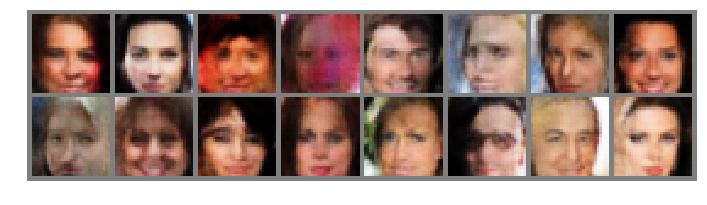

Epoch [    3/   25] | d_loss: 1.1024 | g_loss: 0.9963
Epoch [    3/   25] | d_loss: 1.2287 | g_loss: 1.2014
Epoch [    3/   25] | d_loss: 1.2324 | g_loss: 0.8784
Epoch [    3/   25] | d_loss: 1.1426 | g_loss: 0.9036
Epoch [    3/   25] | d_loss: 1.1336 | g_loss: 0.6985
Epoch [    3/   25] | d_loss: 1.2346 | g_loss: 0.6506
Epoch [    3/   25] | d_loss: 1.2205 | g_loss: 1.6666
Epoch [    3/   25] | d_loss: 1.1556 | g_loss: 0.8836
Epoch [    3/   25] | d_loss: 1.0944 | g_loss: 0.7068
Epoch [    3/   25] | d_loss: 1.0320 | g_loss: 1.0704
Epoch [    3/   25] | d_loss: 1.1880 | g_loss: 0.9538
Epoch [    3/   25] | d_loss: 1.3779 | g_loss: 1.3009
Epoch [    3/   25] | d_loss: 1.0455 | g_loss: 1.0160
Epoch [    3/   25] | d_loss: 1.0999 | g_loss: 0.9544
Epoch [    3/   25] | d_loss: 1.1523 | g_loss: 1.0869
Epoch [    3/   25] | d_loss: 1.0443 | g_loss: 1.1754
Epoch [    3/   25] | d_loss: 1.0642 | g_loss: 1.1573
Epoch [    3/   25] | d_loss: 1.1545 | g_loss: 0.7462
Epoch [    3/   25] | d_loss

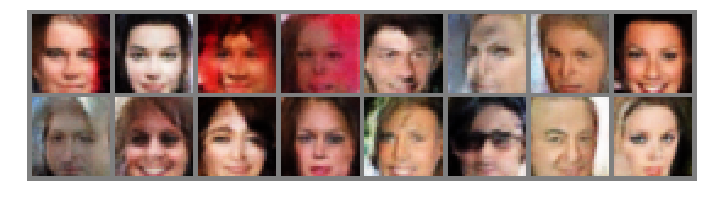

Epoch [    4/   25] | d_loss: 1.0651 | g_loss: 1.3082
Epoch [    4/   25] | d_loss: 1.0796 | g_loss: 1.0020
Epoch [    4/   25] | d_loss: 1.0697 | g_loss: 1.0213
Epoch [    4/   25] | d_loss: 1.0592 | g_loss: 0.8383
Epoch [    4/   25] | d_loss: 1.2068 | g_loss: 1.5855
Epoch [    4/   25] | d_loss: 1.0395 | g_loss: 0.7690
Epoch [    4/   25] | d_loss: 1.0907 | g_loss: 1.2047
Epoch [    4/   25] | d_loss: 1.0795 | g_loss: 0.8289
Epoch [    4/   25] | d_loss: 1.0197 | g_loss: 0.9335
Epoch [    4/   25] | d_loss: 1.0381 | g_loss: 0.9316
Epoch [    4/   25] | d_loss: 0.9598 | g_loss: 1.3911
Epoch [    4/   25] | d_loss: 1.2439 | g_loss: 1.5648
Epoch [    4/   25] | d_loss: 1.5660 | g_loss: 0.5042
Epoch [    4/   25] | d_loss: 1.0573 | g_loss: 0.7869
Epoch [    4/   25] | d_loss: 1.2018 | g_loss: 0.7116
Epoch [    4/   25] | d_loss: 1.0977 | g_loss: 0.8182
Epoch [    4/   25] | d_loss: 0.9545 | g_loss: 0.7830
Epoch [    4/   25] | d_loss: 0.9518 | g_loss: 1.0596
Epoch [    4/   25] | d_loss

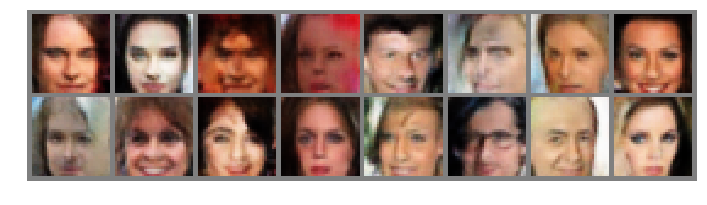

Epoch [    5/   25] | d_loss: 1.1890 | g_loss: 0.8367
Epoch [    5/   25] | d_loss: 1.0795 | g_loss: 0.8073
Epoch [    5/   25] | d_loss: 1.2075 | g_loss: 0.7183
Epoch [    5/   25] | d_loss: 0.9940 | g_loss: 1.2674
Epoch [    5/   25] | d_loss: 0.8836 | g_loss: 1.2676
Epoch [    5/   25] | d_loss: 1.1068 | g_loss: 0.8890
Epoch [    5/   25] | d_loss: 0.9721 | g_loss: 1.1286
Epoch [    5/   25] | d_loss: 1.1498 | g_loss: 0.6331
Epoch [    5/   25] | d_loss: 0.9782 | g_loss: 1.3035
Epoch [    5/   25] | d_loss: 1.0992 | g_loss: 1.0123
Epoch [    5/   25] | d_loss: 1.1049 | g_loss: 0.7587
Epoch [    5/   25] | d_loss: 1.0779 | g_loss: 1.8283
Epoch [    5/   25] | d_loss: 1.1717 | g_loss: 0.8981
Epoch [    5/   25] | d_loss: 0.9676 | g_loss: 1.3391
Epoch [    5/   25] | d_loss: 1.0414 | g_loss: 0.8415
Epoch [    5/   25] | d_loss: 0.8725 | g_loss: 1.1300
Epoch [    5/   25] | d_loss: 0.9832 | g_loss: 0.9787
Epoch [    5/   25] | d_loss: 0.9876 | g_loss: 1.1836
Epoch [    5/   25] | d_loss

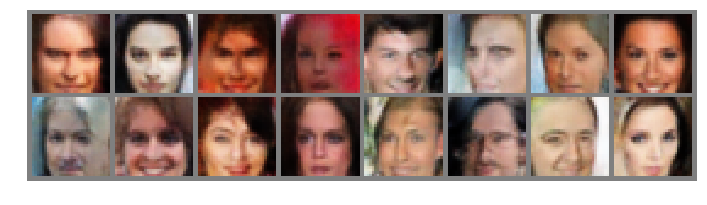

Epoch [    6/   25] | d_loss: 1.0473 | g_loss: 1.4307
Epoch [    6/   25] | d_loss: 1.2237 | g_loss: 0.7578
Epoch [    6/   25] | d_loss: 0.9611 | g_loss: 1.3745
Epoch [    6/   25] | d_loss: 0.8610 | g_loss: 0.8065
Epoch [    6/   25] | d_loss: 1.0191 | g_loss: 1.8129
Epoch [    6/   25] | d_loss: 0.9720 | g_loss: 0.9361
Epoch [    6/   25] | d_loss: 0.9385 | g_loss: 0.8423
Epoch [    6/   25] | d_loss: 1.1767 | g_loss: 0.9395
Epoch [    6/   25] | d_loss: 1.2361 | g_loss: 0.6411
Epoch [    6/   25] | d_loss: 0.8012 | g_loss: 1.4355
Epoch [    6/   25] | d_loss: 1.0473 | g_loss: 1.1770
Epoch [    6/   25] | d_loss: 1.0439 | g_loss: 1.5152
Epoch [    6/   25] | d_loss: 0.9090 | g_loss: 1.5484
Epoch [    6/   25] | d_loss: 0.7693 | g_loss: 1.3056
Epoch [    6/   25] | d_loss: 0.9842 | g_loss: 1.7946
Epoch [    6/   25] | d_loss: 0.9291 | g_loss: 1.0660
Epoch [    6/   25] | d_loss: 0.9258 | g_loss: 1.3672
Epoch [    6/   25] | d_loss: 1.0932 | g_loss: 0.9914
Epoch [    6/   25] | d_loss

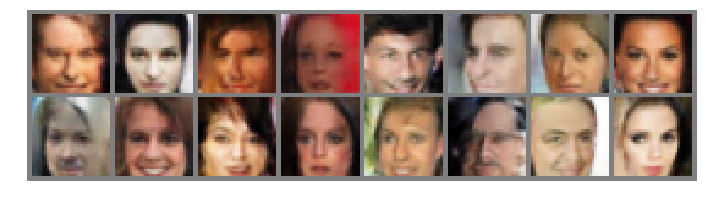

Epoch [    7/   25] | d_loss: 0.8510 | g_loss: 1.0692
Epoch [    7/   25] | d_loss: 0.8846 | g_loss: 1.1751
Epoch [    7/   25] | d_loss: 0.9438 | g_loss: 1.1938
Epoch [    7/   25] | d_loss: 0.7413 | g_loss: 1.0635
Epoch [    7/   25] | d_loss: 1.0440 | g_loss: 1.2068
Epoch [    7/   25] | d_loss: 0.9012 | g_loss: 1.6705
Epoch [    7/   25] | d_loss: 0.8769 | g_loss: 1.2224
Epoch [    7/   25] | d_loss: 1.0410 | g_loss: 0.7717
Epoch [    7/   25] | d_loss: 1.0042 | g_loss: 1.4462
Epoch [    7/   25] | d_loss: 1.0513 | g_loss: 0.9892
Epoch [    7/   25] | d_loss: 0.8697 | g_loss: 1.6622
Epoch [    7/   25] | d_loss: 0.9224 | g_loss: 1.5188
Epoch [    7/   25] | d_loss: 0.8712 | g_loss: 1.5284
Epoch [    7/   25] | d_loss: 0.8728 | g_loss: 1.0624
Epoch [    7/   25] | d_loss: 0.9692 | g_loss: 0.9379
Epoch [    7/   25] | d_loss: 0.9996 | g_loss: 1.3613
Epoch [    7/   25] | d_loss: 1.2009 | g_loss: 0.8454
Epoch [    7/   25] | d_loss: 0.9928 | g_loss: 1.9303
Epoch [    7/   25] | d_loss

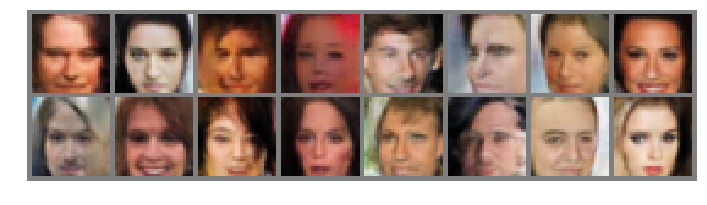

Epoch [    8/   25] | d_loss: 0.8911 | g_loss: 1.1535
Epoch [    8/   25] | d_loss: 1.0083 | g_loss: 1.0741
Epoch [    8/   25] | d_loss: 0.8008 | g_loss: 1.2667
Epoch [    8/   25] | d_loss: 1.1216 | g_loss: 0.6995
Epoch [    8/   25] | d_loss: 0.9403 | g_loss: 2.4005
Epoch [    8/   25] | d_loss: 0.9875 | g_loss: 1.1496
Epoch [    8/   25] | d_loss: 0.9095 | g_loss: 1.2379
Epoch [    8/   25] | d_loss: 0.7946 | g_loss: 1.4446
Epoch [    8/   25] | d_loss: 0.8020 | g_loss: 1.4159
Epoch [    8/   25] | d_loss: 1.0760 | g_loss: 0.7755
Epoch [    8/   25] | d_loss: 0.8254 | g_loss: 1.7123
Epoch [    8/   25] | d_loss: 0.8133 | g_loss: 1.7060
Epoch [    8/   25] | d_loss: 0.9289 | g_loss: 1.5925
Epoch [    8/   25] | d_loss: 0.7505 | g_loss: 1.9088
Epoch [    8/   25] | d_loss: 0.9282 | g_loss: 1.0878
Epoch [    8/   25] | d_loss: 0.9220 | g_loss: 1.0056
Epoch [    8/   25] | d_loss: 1.6200 | g_loss: 2.6531
Epoch [    8/   25] | d_loss: 0.7386 | g_loss: 1.8666
Epoch [    8/   25] | d_loss

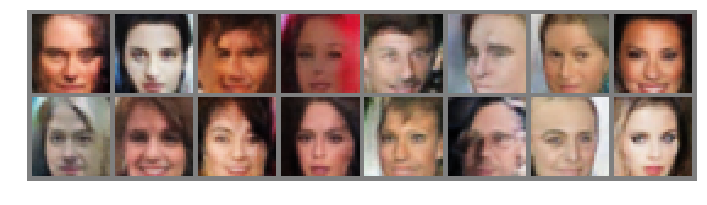

Epoch [    9/   25] | d_loss: 0.6016 | g_loss: 2.0145
Epoch [    9/   25] | d_loss: 0.9754 | g_loss: 1.3250
Epoch [    9/   25] | d_loss: 0.6563 | g_loss: 1.5708
Epoch [    9/   25] | d_loss: 1.2140 | g_loss: 2.3723
Epoch [    9/   25] | d_loss: 0.8654 | g_loss: 2.1423
Epoch [    9/   25] | d_loss: 0.8001 | g_loss: 1.2552
Epoch [    9/   25] | d_loss: 0.8912 | g_loss: 1.9037
Epoch [    9/   25] | d_loss: 0.7031 | g_loss: 1.4534
Epoch [    9/   25] | d_loss: 0.9478 | g_loss: 1.2200
Epoch [    9/   25] | d_loss: 0.8421 | g_loss: 1.7500
Epoch [    9/   25] | d_loss: 1.0315 | g_loss: 2.9107
Epoch [    9/   25] | d_loss: 0.9098 | g_loss: 1.1085
Epoch [    9/   25] | d_loss: 0.8634 | g_loss: 2.7278
Epoch [    9/   25] | d_loss: 0.6641 | g_loss: 1.2387
Epoch [    9/   25] | d_loss: 0.8370 | g_loss: 1.4651
Epoch [    9/   25] | d_loss: 0.7401 | g_loss: 1.6412
Epoch [    9/   25] | d_loss: 0.8826 | g_loss: 1.4603
Epoch [    9/   25] | d_loss: 0.8072 | g_loss: 1.5245
Epoch [    9/   25] | d_loss

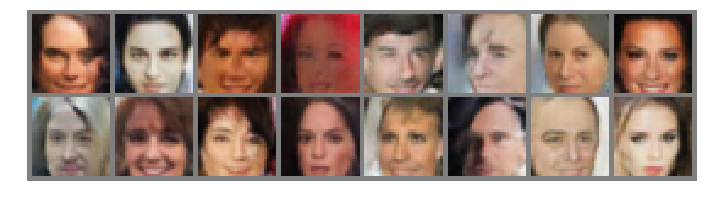

Epoch [   10/   25] | d_loss: 0.8153 | g_loss: 1.8683
Epoch [   10/   25] | d_loss: 0.7752 | g_loss: 1.5123
Epoch [   10/   25] | d_loss: 0.8449 | g_loss: 1.4086
Epoch [   10/   25] | d_loss: 0.6135 | g_loss: 1.5837
Epoch [   10/   25] | d_loss: 0.6764 | g_loss: 1.5028
Epoch [   10/   25] | d_loss: 0.8463 | g_loss: 1.5978
Epoch [   10/   25] | d_loss: 0.8683 | g_loss: 2.2761
Epoch [   10/   25] | d_loss: 0.6247 | g_loss: 1.7626
Epoch [   10/   25] | d_loss: 0.6288 | g_loss: 1.5814
Epoch [   10/   25] | d_loss: 0.8164 | g_loss: 1.4897
Epoch [   10/   25] | d_loss: 0.7029 | g_loss: 1.5596
Epoch [   10/   25] | d_loss: 0.7545 | g_loss: 1.7527
Epoch [   10/   25] | d_loss: 0.8145 | g_loss: 1.2337
Epoch [   10/   25] | d_loss: 0.6041 | g_loss: 1.9581
Epoch [   10/   25] | d_loss: 0.8697 | g_loss: 1.5069
Epoch [   10/   25] | d_loss: 0.8468 | g_loss: 1.1499
Epoch [   10/   25] | d_loss: 0.7989 | g_loss: 2.0370
Epoch [   10/   25] | d_loss: 0.8503 | g_loss: 1.9378
Epoch [   10/   25] | d_loss

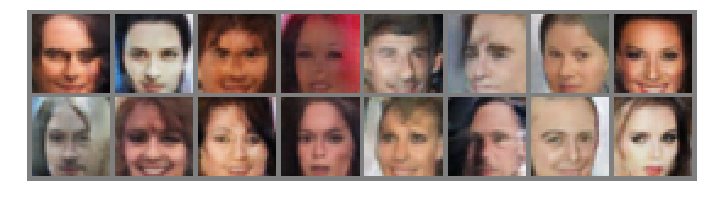

Epoch [   11/   25] | d_loss: 0.9890 | g_loss: 0.5481
Epoch [   11/   25] | d_loss: 0.8086 | g_loss: 2.9250
Epoch [   11/   25] | d_loss: 0.7503 | g_loss: 1.5802
Epoch [   11/   25] | d_loss: 0.8566 | g_loss: 1.2378
Epoch [   11/   25] | d_loss: 0.6284 | g_loss: 1.9445
Epoch [   11/   25] | d_loss: 0.4709 | g_loss: 2.1224
Epoch [   11/   25] | d_loss: 0.8338 | g_loss: 1.9737
Epoch [   11/   25] | d_loss: 1.0393 | g_loss: 3.1236
Epoch [   11/   25] | d_loss: 0.5992 | g_loss: 2.0506
Epoch [   11/   25] | d_loss: 0.9065 | g_loss: 1.4216
Epoch [   11/   25] | d_loss: 1.2229 | g_loss: 0.5829
Epoch [   11/   25] | d_loss: 0.7784 | g_loss: 1.8848
Epoch [   11/   25] | d_loss: 0.7570 | g_loss: 1.4293
Epoch [   11/   25] | d_loss: 0.7033 | g_loss: 1.8364
Epoch [   11/   25] | d_loss: 0.6877 | g_loss: 1.6264
Epoch [   11/   25] | d_loss: 0.6172 | g_loss: 2.2048
Epoch [   11/   25] | d_loss: 0.7267 | g_loss: 0.9830
Epoch [   11/   25] | d_loss: 0.7615 | g_loss: 1.7946
Epoch [   11/   25] | d_loss

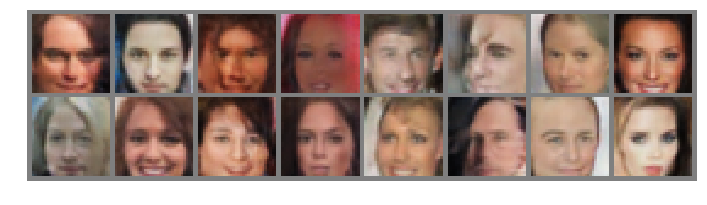

Epoch [   12/   25] | d_loss: 0.7159 | g_loss: 2.3393
Epoch [   12/   25] | d_loss: 0.5948 | g_loss: 1.7252
Epoch [   12/   25] | d_loss: 0.5187 | g_loss: 1.1991
Epoch [   12/   25] | d_loss: 0.8101 | g_loss: 1.7796
Epoch [   12/   25] | d_loss: 0.8603 | g_loss: 1.6437
Epoch [   12/   25] | d_loss: 0.6238 | g_loss: 1.4747
Epoch [   12/   25] | d_loss: 0.6637 | g_loss: 1.9336
Epoch [   12/   25] | d_loss: 0.7704 | g_loss: 1.6735
Epoch [   12/   25] | d_loss: 0.7187 | g_loss: 1.0614
Epoch [   12/   25] | d_loss: 0.8473 | g_loss: 2.7083
Epoch [   12/   25] | d_loss: 0.6047 | g_loss: 1.8711
Epoch [   12/   25] | d_loss: 0.6939 | g_loss: 2.9734
Epoch [   12/   25] | d_loss: 0.8788 | g_loss: 2.3597
Epoch [   12/   25] | d_loss: 0.6695 | g_loss: 1.2190
Epoch [   12/   25] | d_loss: 0.5508 | g_loss: 1.8560
Epoch [   12/   25] | d_loss: 0.6968 | g_loss: 1.8463
Epoch [   12/   25] | d_loss: 0.5447 | g_loss: 1.1083
Epoch [   12/   25] | d_loss: 0.5851 | g_loss: 1.7451
Epoch [   12/   25] | d_loss

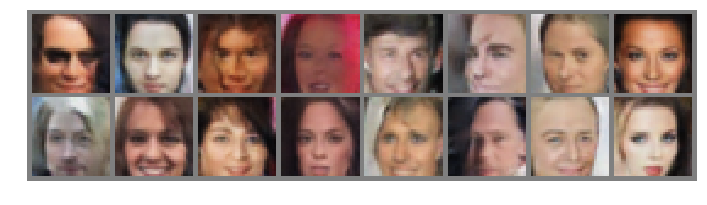

Epoch [   13/   25] | d_loss: 1.4417 | g_loss: 2.7097
Epoch [   13/   25] | d_loss: 0.7219 | g_loss: 1.1287
Epoch [   13/   25] | d_loss: 0.6221 | g_loss: 1.7938
Epoch [   13/   25] | d_loss: 0.7620 | g_loss: 2.0293
Epoch [   13/   25] | d_loss: 0.7522 | g_loss: 1.4424
Epoch [   13/   25] | d_loss: 0.7951 | g_loss: 2.7313
Epoch [   13/   25] | d_loss: 1.0939 | g_loss: 0.9905
Epoch [   13/   25] | d_loss: 0.6491 | g_loss: 2.1978
Epoch [   13/   25] | d_loss: 0.5181 | g_loss: 2.0994
Epoch [   13/   25] | d_loss: 0.6249 | g_loss: 1.7758
Epoch [   13/   25] | d_loss: 0.7815 | g_loss: 1.4924
Epoch [   13/   25] | d_loss: 0.8394 | g_loss: 1.2615
Epoch [   13/   25] | d_loss: 0.8510 | g_loss: 1.5356
Epoch [   13/   25] | d_loss: 0.5320 | g_loss: 2.2664
Epoch [   13/   25] | d_loss: 0.6029 | g_loss: 1.8424
Epoch [   13/   25] | d_loss: 0.6540 | g_loss: 2.8285
Epoch [   13/   25] | d_loss: 0.7551 | g_loss: 1.9828
Epoch [   13/   25] | d_loss: 0.5799 | g_loss: 2.5701
Epoch [   13/   25] | d_loss

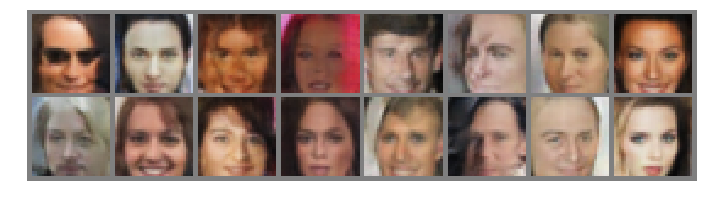

Epoch [   14/   25] | d_loss: 0.8157 | g_loss: 1.0966
Epoch [   14/   25] | d_loss: 0.5956 | g_loss: 2.5355
Epoch [   14/   25] | d_loss: 0.5043 | g_loss: 2.3612
Epoch [   14/   25] | d_loss: 0.4631 | g_loss: 1.3439
Epoch [   14/   25] | d_loss: 0.6797 | g_loss: 1.7005
Epoch [   14/   25] | d_loss: 0.4936 | g_loss: 2.0861
Epoch [   14/   25] | d_loss: 0.4049 | g_loss: 2.5751
Epoch [   14/   25] | d_loss: 0.5333 | g_loss: 2.3385
Epoch [   14/   25] | d_loss: 0.5982 | g_loss: 1.8693
Epoch [   14/   25] | d_loss: 0.6653 | g_loss: 2.4587
Epoch [   14/   25] | d_loss: 0.4774 | g_loss: 2.2426
Epoch [   14/   25] | d_loss: 0.5777 | g_loss: 1.5448
Epoch [   14/   25] | d_loss: 0.6479 | g_loss: 1.9018
Epoch [   14/   25] | d_loss: 0.7543 | g_loss: 0.9243
Epoch [   14/   25] | d_loss: 0.8063 | g_loss: 2.8156
Epoch [   14/   25] | d_loss: 0.7219 | g_loss: 1.0267
Epoch [   14/   25] | d_loss: 0.5426 | g_loss: 1.9606
Epoch [   14/   25] | d_loss: 0.6438 | g_loss: 1.3996
Epoch [   14/   25] | d_loss

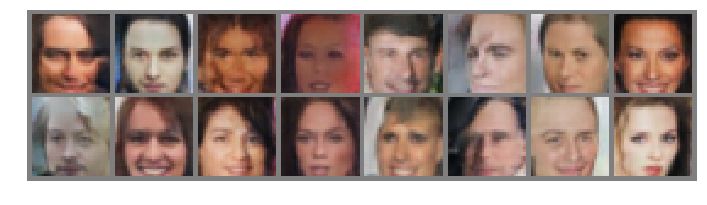

Epoch [   15/   25] | d_loss: 0.9335 | g_loss: 2.9649
Epoch [   15/   25] | d_loss: 0.5000 | g_loss: 2.6508
Epoch [   15/   25] | d_loss: 0.7820 | g_loss: 3.5042
Epoch [   15/   25] | d_loss: 0.6452 | g_loss: 1.7934
Epoch [   15/   25] | d_loss: 0.5151 | g_loss: 2.7413
Epoch [   15/   25] | d_loss: 0.8210 | g_loss: 3.0867
Epoch [   15/   25] | d_loss: 0.4511 | g_loss: 2.8391
Epoch [   15/   25] | d_loss: 0.8406 | g_loss: 2.4137
Epoch [   15/   25] | d_loss: 0.8296 | g_loss: 3.2904
Epoch [   15/   25] | d_loss: 0.7637 | g_loss: 1.7248
Epoch [   15/   25] | d_loss: 1.0656 | g_loss: 5.2408
Epoch [   15/   25] | d_loss: 0.6740 | g_loss: 1.7789
Epoch [   15/   25] | d_loss: 0.6964 | g_loss: 1.6116
Epoch [   15/   25] | d_loss: 0.7610 | g_loss: 1.4361
Epoch [   15/   25] | d_loss: 0.7863 | g_loss: 1.8775
Epoch [   15/   25] | d_loss: 0.6067 | g_loss: 1.8541
Epoch [   15/   25] | d_loss: 0.8031 | g_loss: 2.3856
Epoch [   15/   25] | d_loss: 0.6496 | g_loss: 1.4780
Epoch [   15/   25] | d_loss

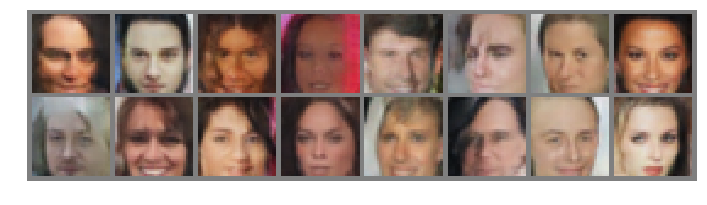

Epoch [   16/   25] | d_loss: 0.9089 | g_loss: 1.0058
Epoch [   16/   25] | d_loss: 0.4788 | g_loss: 2.9964
Epoch [   16/   25] | d_loss: 0.7459 | g_loss: 1.9025
Epoch [   16/   25] | d_loss: 0.6213 | g_loss: 2.3606
Epoch [   16/   25] | d_loss: 0.6784 | g_loss: 3.1262
Epoch [   16/   25] | d_loss: 0.6961 | g_loss: 2.4374
Epoch [   16/   25] | d_loss: 0.6137 | g_loss: 2.6237
Epoch [   16/   25] | d_loss: 0.5612 | g_loss: 2.4416
Epoch [   16/   25] | d_loss: 0.9277 | g_loss: 1.4210
Epoch [   16/   25] | d_loss: 0.5512 | g_loss: 2.4717
Epoch [   16/   25] | d_loss: 0.6280 | g_loss: 1.3686
Epoch [   16/   25] | d_loss: 0.5121 | g_loss: 1.8632
Epoch [   16/   25] | d_loss: 0.6145 | g_loss: 2.5574
Epoch [   16/   25] | d_loss: 0.8074 | g_loss: 2.4292
Epoch [   16/   25] | d_loss: 0.6302 | g_loss: 2.8110
Epoch [   16/   25] | d_loss: 0.7586 | g_loss: 1.1173
Epoch [   16/   25] | d_loss: 0.9101 | g_loss: 1.0852
Epoch [   16/   25] | d_loss: 1.2219 | g_loss: 3.7329
Epoch [   16/   25] | d_loss

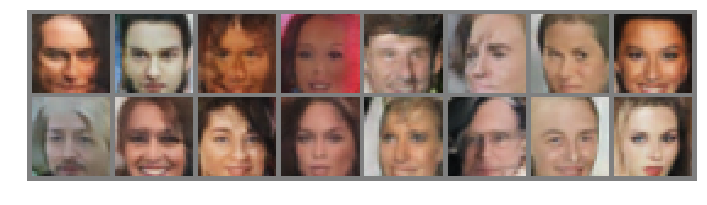

Epoch [   17/   25] | d_loss: 0.6850 | g_loss: 2.1334
Epoch [   17/   25] | d_loss: 0.7087 | g_loss: 2.9414
Epoch [   17/   25] | d_loss: 0.7301 | g_loss: 2.1644
Epoch [   17/   25] | d_loss: 0.4778 | g_loss: 2.4652
Epoch [   17/   25] | d_loss: 0.6190 | g_loss: 2.6118
Epoch [   17/   25] | d_loss: 0.7725 | g_loss: 4.1470
Epoch [   17/   25] | d_loss: 0.6757 | g_loss: 2.0517
Epoch [   17/   25] | d_loss: 0.6046 | g_loss: 4.5159
Epoch [   17/   25] | d_loss: 0.8694 | g_loss: 2.2847
Epoch [   17/   25] | d_loss: 0.5479 | g_loss: 2.4666
Epoch [   17/   25] | d_loss: 1.0506 | g_loss: 0.7721
Epoch [   17/   25] | d_loss: 0.5617 | g_loss: 2.0905
Epoch [   17/   25] | d_loss: 0.7994 | g_loss: 1.6063
Epoch [   17/   25] | d_loss: 0.7801 | g_loss: 2.9640
Epoch [   17/   25] | d_loss: 0.4760 | g_loss: 2.6072
Epoch [   17/   25] | d_loss: 0.6188 | g_loss: 2.8396
Epoch [   17/   25] | d_loss: 0.6866 | g_loss: 2.2370
Epoch [   17/   25] | d_loss: 0.8153 | g_loss: 1.3724
Epoch [   17/   25] | d_loss

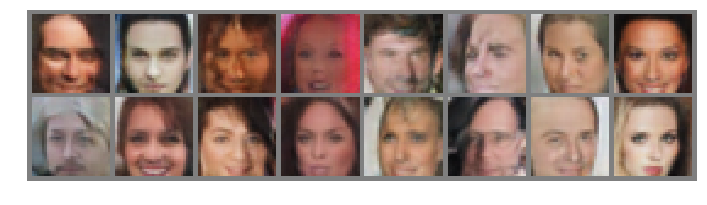

Epoch [   18/   25] | d_loss: 0.5142 | g_loss: 2.0344
Epoch [   18/   25] | d_loss: 0.6563 | g_loss: 1.9719
Epoch [   18/   25] | d_loss: 0.6596 | g_loss: 2.0263
Epoch [   18/   25] | d_loss: 0.6231 | g_loss: 2.6977
Epoch [   18/   25] | d_loss: 0.5853 | g_loss: 2.2924
Epoch [   18/   25] | d_loss: 0.8621 | g_loss: 4.4435
Epoch [   18/   25] | d_loss: 0.5591 | g_loss: 1.7461
Epoch [   18/   25] | d_loss: 0.8346 | g_loss: 4.0495
Epoch [   18/   25] | d_loss: 0.8966 | g_loss: 1.8155
Epoch [   18/   25] | d_loss: 0.5901 | g_loss: 3.7051
Epoch [   18/   25] | d_loss: 0.8737 | g_loss: 1.7080
Epoch [   18/   25] | d_loss: 0.7532 | g_loss: 2.7036
Epoch [   18/   25] | d_loss: 0.5512 | g_loss: 1.9812
Epoch [   18/   25] | d_loss: 0.5167 | g_loss: 3.3389
Epoch [   18/   25] | d_loss: 0.5641 | g_loss: 2.8786
Epoch [   18/   25] | d_loss: 0.6727 | g_loss: 2.6031
Epoch [   18/   25] | d_loss: 0.5693 | g_loss: 2.6256
Epoch [   18/   25] | d_loss: 3.9217 | g_loss: 0.3448
Epoch [   18/   25] | d_loss

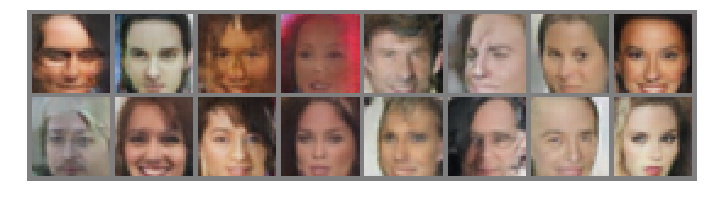

Epoch [   19/   25] | d_loss: 0.6339 | g_loss: 2.3965
Epoch [   19/   25] | d_loss: 0.7053 | g_loss: 2.7451
Epoch [   19/   25] | d_loss: 0.4124 | g_loss: 1.7594
Epoch [   19/   25] | d_loss: 0.5795 | g_loss: 2.3863
Epoch [   19/   25] | d_loss: 0.8141 | g_loss: 3.8578
Epoch [   19/   25] | d_loss: 0.5329 | g_loss: 2.1295
Epoch [   19/   25] | d_loss: 0.5353 | g_loss: 3.0761
Epoch [   19/   25] | d_loss: 0.5189 | g_loss: 2.7823
Epoch [   19/   25] | d_loss: 1.1417 | g_loss: 1.6618
Epoch [   19/   25] | d_loss: 0.7109 | g_loss: 1.2863
Epoch [   19/   25] | d_loss: 0.7118 | g_loss: 0.9391
Epoch [   19/   25] | d_loss: 0.5018 | g_loss: 2.9113
Epoch [   19/   25] | d_loss: 0.9476 | g_loss: 5.1740
Epoch [   19/   25] | d_loss: 0.5852 | g_loss: 2.6111
Epoch [   19/   25] | d_loss: 0.6819 | g_loss: 2.2256
Epoch [   19/   25] | d_loss: 0.5665 | g_loss: 2.3933
Epoch [   19/   25] | d_loss: 0.6647 | g_loss: 2.6748
Epoch [   19/   25] | d_loss: 0.5565 | g_loss: 2.4891
Epoch [   19/   25] | d_loss

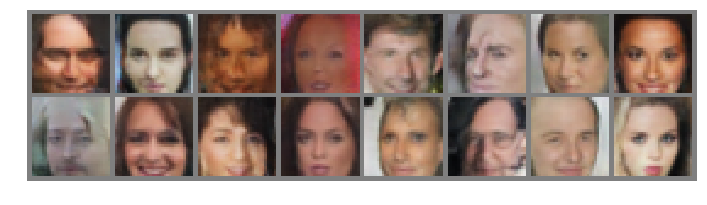

Epoch [   20/   25] | d_loss: 0.6028 | g_loss: 2.6460
Epoch [   20/   25] | d_loss: 0.4405 | g_loss: 3.1316
Epoch [   20/   25] | d_loss: 0.5496 | g_loss: 1.9979
Epoch [   20/   25] | d_loss: 0.5944 | g_loss: 1.4894
Epoch [   20/   25] | d_loss: 0.6762 | g_loss: 1.8222
Epoch [   20/   25] | d_loss: 0.5115 | g_loss: 1.5304
Epoch [   20/   25] | d_loss: 0.3223 | g_loss: 3.2810
Epoch [   20/   25] | d_loss: 0.6130 | g_loss: 2.8878
Epoch [   20/   25] | d_loss: 0.6227 | g_loss: 2.3331
Epoch [   20/   25] | d_loss: 0.4103 | g_loss: 3.2421
Epoch [   20/   25] | d_loss: 0.4873 | g_loss: 1.7925
Epoch [   20/   25] | d_loss: 0.6393 | g_loss: 3.2358
Epoch [   20/   25] | d_loss: 0.5839 | g_loss: 1.9913
Epoch [   20/   25] | d_loss: 0.5596 | g_loss: 2.2192
Epoch [   20/   25] | d_loss: 1.1211 | g_loss: 0.8791
Epoch [   20/   25] | d_loss: 0.5992 | g_loss: 2.1382
Epoch [   20/   25] | d_loss: 0.4560 | g_loss: 2.6290
Epoch [   20/   25] | d_loss: 0.6196 | g_loss: 2.3165
Epoch [   20/   25] | d_loss

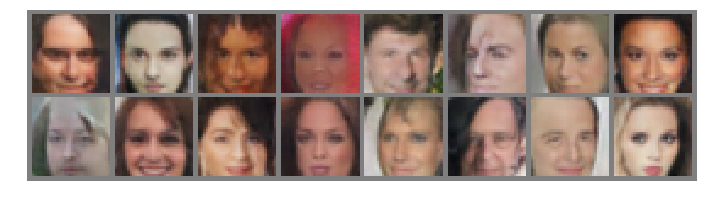

Epoch [   21/   25] | d_loss: 0.6288 | g_loss: 2.0855
Epoch [   21/   25] | d_loss: 0.6345 | g_loss: 2.3461
Epoch [   21/   25] | d_loss: 0.6161 | g_loss: 3.2095
Epoch [   21/   25] | d_loss: 0.6957 | g_loss: 2.2808
Epoch [   21/   25] | d_loss: 0.8517 | g_loss: 1.0386
Epoch [   21/   25] | d_loss: 0.5716 | g_loss: 2.1729
Epoch [   21/   25] | d_loss: 0.4268 | g_loss: 3.0892
Epoch [   21/   25] | d_loss: 0.5749 | g_loss: 2.6081
Epoch [   21/   25] | d_loss: 0.6639 | g_loss: 1.7718
Epoch [   21/   25] | d_loss: 0.4516 | g_loss: 3.2769
Epoch [   21/   25] | d_loss: 0.4985 | g_loss: 1.3723
Epoch [   21/   25] | d_loss: 0.8464 | g_loss: 1.5919
Epoch [   21/   25] | d_loss: 2.8783 | g_loss: 0.6114
Epoch [   21/   25] | d_loss: 0.7244 | g_loss: 2.4368
Epoch [   21/   25] | d_loss: 0.6130 | g_loss: 3.8487
Epoch [   21/   25] | d_loss: 0.5307 | g_loss: 3.3188
Epoch [   21/   25] | d_loss: 0.5482 | g_loss: 2.9046
Epoch [   21/   25] | d_loss: 0.4579 | g_loss: 2.8184
Epoch [   21/   25] | d_loss

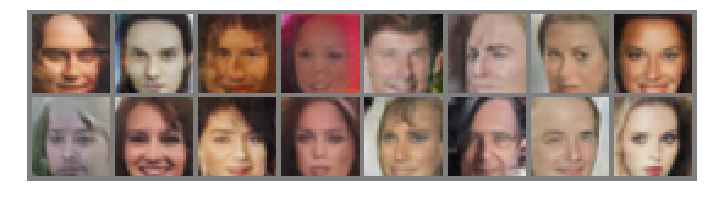

Epoch [   22/   25] | d_loss: 0.6222 | g_loss: 1.9906
Epoch [   22/   25] | d_loss: 0.5916 | g_loss: 0.9225
Epoch [   22/   25] | d_loss: 0.3793 | g_loss: 2.9575
Epoch [   22/   25] | d_loss: 0.7220 | g_loss: 2.7951
Epoch [   22/   25] | d_loss: 0.4791 | g_loss: 2.2580
Epoch [   22/   25] | d_loss: 0.4638 | g_loss: 1.7741
Epoch [   22/   25] | d_loss: 0.4834 | g_loss: 3.4894
Epoch [   22/   25] | d_loss: 0.6120 | g_loss: 2.1916
Epoch [   22/   25] | d_loss: 0.5899 | g_loss: 2.6965
Epoch [   22/   25] | d_loss: 0.3496 | g_loss: 2.2109
Epoch [   22/   25] | d_loss: 0.3578 | g_loss: 2.3165
Epoch [   22/   25] | d_loss: 0.6760 | g_loss: 1.9713
Epoch [   22/   25] | d_loss: 0.6050 | g_loss: 1.9545
Epoch [   22/   25] | d_loss: 0.7088 | g_loss: 3.2094
Epoch [   22/   25] | d_loss: 0.7464 | g_loss: 2.8246
Epoch [   22/   25] | d_loss: 0.4727 | g_loss: 2.4009
Epoch [   22/   25] | d_loss: 0.7484 | g_loss: 1.5995
Epoch [   22/   25] | d_loss: 0.8063 | g_loss: 1.2820
Epoch [   22/   25] | d_loss

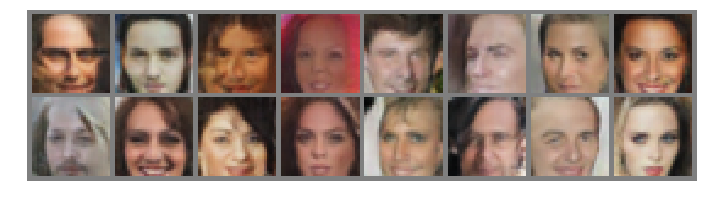

Epoch [   23/   25] | d_loss: 0.4950 | g_loss: 2.6532
Epoch [   23/   25] | d_loss: 0.6521 | g_loss: 2.2162
Epoch [   23/   25] | d_loss: 0.5128 | g_loss: 1.4888
Epoch [   23/   25] | d_loss: 0.5147 | g_loss: 2.2147
Epoch [   23/   25] | d_loss: 0.6221 | g_loss: 3.5018
Epoch [   23/   25] | d_loss: 0.5414 | g_loss: 2.6045
Epoch [   23/   25] | d_loss: 0.6132 | g_loss: 5.0320
Epoch [   23/   25] | d_loss: 0.4992 | g_loss: 2.4032
Epoch [   23/   25] | d_loss: 0.7186 | g_loss: 2.7260
Epoch [   23/   25] | d_loss: 0.6206 | g_loss: 2.9127
Epoch [   23/   25] | d_loss: 0.8435 | g_loss: 4.2056
Epoch [   23/   25] | d_loss: 0.5025 | g_loss: 1.9991
Epoch [   23/   25] | d_loss: 0.9652 | g_loss: 3.0738
Epoch [   23/   25] | d_loss: 0.4453 | g_loss: 1.8801
Epoch [   23/   25] | d_loss: 0.5494 | g_loss: 3.0323
Epoch [   23/   25] | d_loss: 0.6260 | g_loss: 2.2419
Epoch [   23/   25] | d_loss: 0.7968 | g_loss: 3.8608
Epoch [   23/   25] | d_loss: 0.4279 | g_loss: 2.8179
Epoch [   23/   25] | d_loss

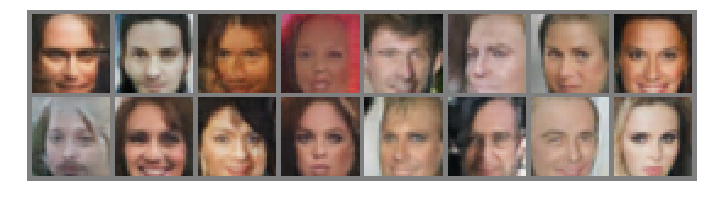

Epoch [   24/   25] | d_loss: 0.6663 | g_loss: 2.0693
Epoch [   24/   25] | d_loss: 0.7074 | g_loss: 2.4476
Epoch [   24/   25] | d_loss: 0.4907 | g_loss: 3.3760
Epoch [   24/   25] | d_loss: 0.5398 | g_loss: 3.2531
Epoch [   24/   25] | d_loss: 0.7862 | g_loss: 2.3739
Epoch [   24/   25] | d_loss: 0.5275 | g_loss: 3.9435
Epoch [   24/   25] | d_loss: 0.9667 | g_loss: 2.6986
Epoch [   24/   25] | d_loss: 0.3924 | g_loss: 1.8358
Epoch [   24/   25] | d_loss: 0.4830 | g_loss: 2.8264
Epoch [   24/   25] | d_loss: 0.4725 | g_loss: 2.1614
Epoch [   24/   25] | d_loss: 0.4163 | g_loss: 2.9549
Epoch [   24/   25] | d_loss: 0.5049 | g_loss: 2.0905
Epoch [   24/   25] | d_loss: 0.5445 | g_loss: 4.1955
Epoch [   24/   25] | d_loss: 0.4176 | g_loss: 3.3439
Epoch [   24/   25] | d_loss: 0.5345 | g_loss: 2.8281
Epoch [   24/   25] | d_loss: 0.6077 | g_loss: 2.0608
Epoch [   24/   25] | d_loss: 0.5696 | g_loss: 1.7874
Epoch [   24/   25] | d_loss: 0.4614 | g_loss: 2.9210
Epoch [   24/   25] | d_loss

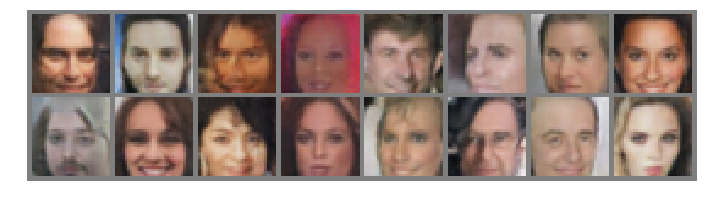

Epoch [   25/   25] | d_loss: 0.4952 | g_loss: 2.9502
Epoch [   25/   25] | d_loss: 0.5276 | g_loss: 3.6993
Epoch [   25/   25] | d_loss: 0.5435 | g_loss: 2.5877
Epoch [   25/   25] | d_loss: 0.4979 | g_loss: 3.5793
Epoch [   25/   25] | d_loss: 0.6872 | g_loss: 4.0777
Epoch [   25/   25] | d_loss: 1.9271 | g_loss: 0.7682
Epoch [   25/   25] | d_loss: 0.5642 | g_loss: 3.0220
Epoch [   25/   25] | d_loss: 0.4556 | g_loss: 2.7411
Epoch [   25/   25] | d_loss: 0.5681 | g_loss: 2.7876
Epoch [   25/   25] | d_loss: 0.4758 | g_loss: 3.3528
Epoch [   25/   25] | d_loss: 0.4963 | g_loss: 3.1976
Epoch [   25/   25] | d_loss: 0.4702 | g_loss: 2.2631
Epoch [   25/   25] | d_loss: 0.4720 | g_loss: 2.5458
Epoch [   25/   25] | d_loss: 0.5225 | g_loss: 4.5076
Epoch [   25/   25] | d_loss: 0.6161 | g_loss: 2.7275
Epoch [   25/   25] | d_loss: 0.6166 | g_loss: 3.2568
Epoch [   25/   25] | d_loss: 0.4787 | g_loss: 3.3318
Epoch [   25/   25] | d_loss: 0.5975 | g_loss: 2.6158
Epoch [   25/   25] | d_loss

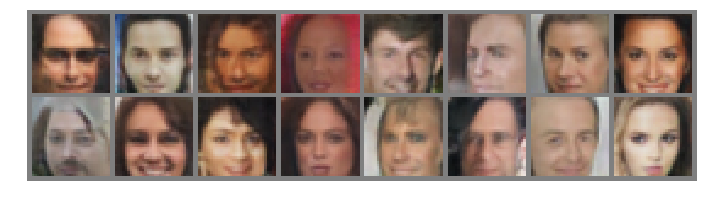

In [22]:
# set number of epochs 

n_epochs = 25
#batch_size = 32
#lr = 0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

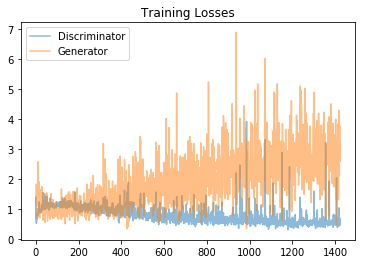

In [23]:
#######################
## This is the best result that I got, it occurs with the hyperparameter values that are listed.
# 25 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [24]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))

In [25]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

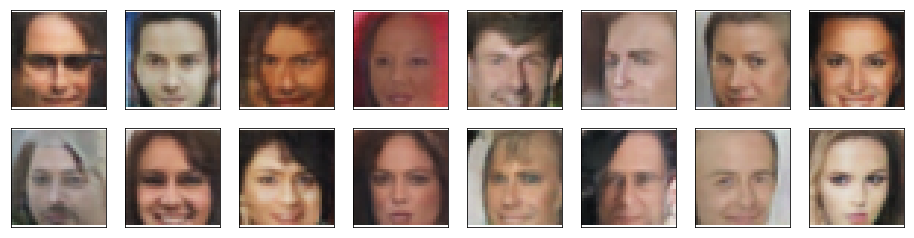

In [26]:
# 25 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
_ = view_samples(-1, samples)

In [ ]:
#---------------Results of hyperparameter tuning

In [ ]:
######################################33

## The following are results of failed experiments trying to generate the images. The most important fix I had to do was to
## improve the architecture of the model. In the beginning I wanted to do this exactly as if it was a CNN only and that didn't
## work. The Discriminator is a convolutional classifier but that doesn't mean that I have to approach the CDGAN as if 
## it is a CNN. I wanted to do the hyperparameter tunning of the CDGAN as if it was a CNN but it doesn't work in the exact 
## same way. There are similarities but it was definitely not the same. For the CDGAN my priority was not to reduce the loss
## as it was for the CNN. Here I had to find a balance between the loss of the Discriminator and the loss of the Generator. 
## In the beginning I wasn't using dropout at all, my learning rate was too big for my architecture and parameters and my batch
## size was not helping me. So the result was that I wasn't generating faces. I believe I was experiencing the vanishing 
## gradient problem and and overfitting, the dropout that I added in both the discriminator and the generator helped 
## avoid the overfitting and the relu in the Generator helped with vanishing gradients. 

In [ ]:
#---------------

Epoch [    1/    5] | d_loss: 1.3847 | g_loss: 0.6916
Epoch [    1/    5] | d_loss: 0.8191 | g_loss: 1.0532
Epoch [    1/    5] | d_loss: 0.7197 | g_loss: 1.4298
Epoch [    1/    5] | d_loss: 0.6496 | g_loss: 1.7945
Epoch [    1/    5] | d_loss: 0.5033 | g_loss: 2.0978
Epoch [    1/    5] | d_loss: 0.5879 | g_loss: 2.1631
Epoch [    1/    5] | d_loss: 0.7090 | g_loss: 1.5393
Epoch [    1/    5] | d_loss: 0.7816 | g_loss: 1.0374
Epoch [    1/    5] | d_loss: 0.8461 | g_loss: 2.0856
Epoch [    1/    5] | d_loss: 0.8038 | g_loss: 1.4672
Epoch [    1/    5] | d_loss: 0.9284 | g_loss: 1.0991
Epoch [    1/    5] | d_loss: 1.2077 | g_loss: 2.3780
Epoch [    1/    5] | d_loss: 0.7295 | g_loss: 1.6403
Epoch [    1/    5] | d_loss: 0.8864 | g_loss: 2.0862
Epoch [    1/    5] | d_loss: 1.1661 | g_loss: 0.8501
Epoch [    1/    5] | d_loss: 0.7968 | g_loss: 1.3729
Epoch [    1/    5] | d_loss: 1.0133 | g_loss: 0.9703
Epoch [    1/    5] | d_loss: 1.4231 | g_loss: 0.8887
Epoch [    1/    5] | d_loss

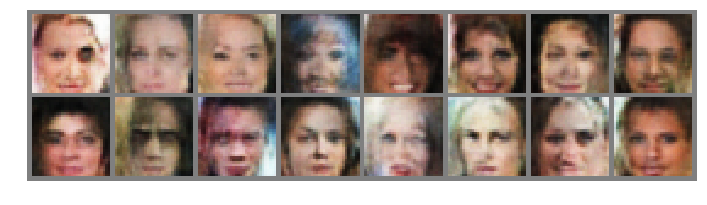

Epoch [    2/    5] | d_loss: 1.2458 | g_loss: 1.3013
Epoch [    2/    5] | d_loss: 1.1726 | g_loss: 0.6620
Epoch [    2/    5] | d_loss: 1.2006 | g_loss: 0.8378
Epoch [    2/    5] | d_loss: 1.2793 | g_loss: 0.6629
Epoch [    2/    5] | d_loss: 1.0665 | g_loss: 1.0067
Epoch [    2/    5] | d_loss: 1.1400 | g_loss: 1.0430
Epoch [    2/    5] | d_loss: 1.2564 | g_loss: 0.7458
Epoch [    2/    5] | d_loss: 1.1510 | g_loss: 1.1225
Epoch [    2/    5] | d_loss: 1.1682 | g_loss: 0.8941
Epoch [    2/    5] | d_loss: 1.1329 | g_loss: 0.8526
Epoch [    2/    5] | d_loss: 1.1415 | g_loss: 1.1932
Epoch [    2/    5] | d_loss: 1.3501 | g_loss: 1.0254
Epoch [    2/    5] | d_loss: 1.1474 | g_loss: 0.8292
Epoch [    2/    5] | d_loss: 1.1172 | g_loss: 0.9191
Epoch [    2/    5] | d_loss: 1.0980 | g_loss: 0.9476
Epoch [    2/    5] | d_loss: 1.2878 | g_loss: 1.1999
Epoch [    2/    5] | d_loss: 1.0255 | g_loss: 0.9544
Epoch [    2/    5] | d_loss: 1.0325 | g_loss: 1.1208
Epoch [    2/    5] | d_loss

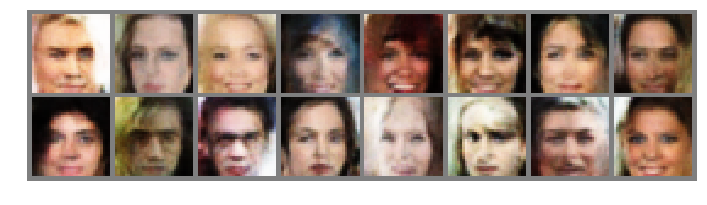

Epoch [    3/    5] | d_loss: 1.0272 | g_loss: 1.1780
Epoch [    3/    5] | d_loss: 1.0077 | g_loss: 0.6964
Epoch [    3/    5] | d_loss: 1.2235 | g_loss: 1.0739
Epoch [    3/    5] | d_loss: 1.3086 | g_loss: 0.6272
Epoch [    3/    5] | d_loss: 1.1257 | g_loss: 0.6456
Epoch [    3/    5] | d_loss: 0.8825 | g_loss: 0.9877
Epoch [    3/    5] | d_loss: 0.9990 | g_loss: 0.7511
Epoch [    3/    5] | d_loss: 1.2207 | g_loss: 1.3453
Epoch [    3/    5] | d_loss: 1.0682 | g_loss: 1.0126
Epoch [    3/    5] | d_loss: 1.0296 | g_loss: 0.9650
Epoch [    3/    5] | d_loss: 1.1094 | g_loss: 1.0275
Epoch [    3/    5] | d_loss: 1.1878 | g_loss: 1.1411
Epoch [    3/    5] | d_loss: 1.1833 | g_loss: 1.1269
Epoch [    3/    5] | d_loss: 1.0865 | g_loss: 0.5608
Epoch [    3/    5] | d_loss: 1.1376 | g_loss: 0.8986
Epoch [    3/    5] | d_loss: 1.2420 | g_loss: 1.2266
Epoch [    3/    5] | d_loss: 1.1228 | g_loss: 1.1896
Epoch [    3/    5] | d_loss: 1.3268 | g_loss: 0.6744
Epoch [    3/    5] | d_loss

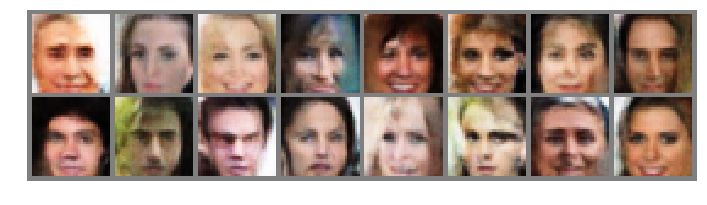

Epoch [    4/    5] | d_loss: 1.0925 | g_loss: 1.0342
Epoch [    4/    5] | d_loss: 1.2457 | g_loss: 0.6743
Epoch [    4/    5] | d_loss: 1.0356 | g_loss: 0.7313
Epoch [    4/    5] | d_loss: 1.0077 | g_loss: 1.4889
Epoch [    4/    5] | d_loss: 1.1935 | g_loss: 1.1432
Epoch [    4/    5] | d_loss: 1.0618 | g_loss: 0.7267
Epoch [    4/    5] | d_loss: 1.0311 | g_loss: 0.8228
Epoch [    4/    5] | d_loss: 0.9923 | g_loss: 0.9650
Epoch [    4/    5] | d_loss: 1.1928 | g_loss: 0.8317
Epoch [    4/    5] | d_loss: 1.3389 | g_loss: 0.7400
Epoch [    4/    5] | d_loss: 1.1033 | g_loss: 0.7314
Epoch [    4/    5] | d_loss: 1.1053 | g_loss: 1.0552
Epoch [    4/    5] | d_loss: 0.9819 | g_loss: 1.4399
Epoch [    4/    5] | d_loss: 1.2217 | g_loss: 1.1841
Epoch [    4/    5] | d_loss: 1.0121 | g_loss: 1.1313
Epoch [    4/    5] | d_loss: 1.1712 | g_loss: 0.7819
Epoch [    4/    5] | d_loss: 1.0184 | g_loss: 1.0374
Epoch [    4/    5] | d_loss: 1.1581 | g_loss: 1.0358
Epoch [    4/    5] | d_loss

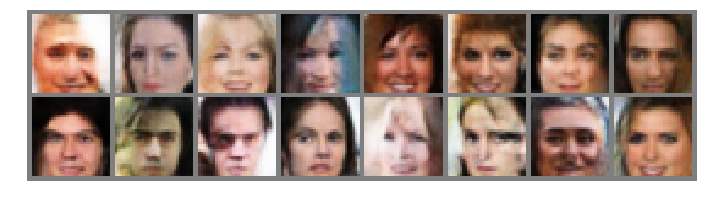

Epoch [    5/    5] | d_loss: 0.9762 | g_loss: 1.1455
Epoch [    5/    5] | d_loss: 1.0069 | g_loss: 1.0461
Epoch [    5/    5] | d_loss: 1.1181 | g_loss: 1.0407
Epoch [    5/    5] | d_loss: 1.1293 | g_loss: 1.6390
Epoch [    5/    5] | d_loss: 0.9972 | g_loss: 1.5171
Epoch [    5/    5] | d_loss: 1.1696 | g_loss: 1.7914
Epoch [    5/    5] | d_loss: 1.0607 | g_loss: 0.7959
Epoch [    5/    5] | d_loss: 1.0813 | g_loss: 0.7003
Epoch [    5/    5] | d_loss: 0.9668 | g_loss: 1.2134
Epoch [    5/    5] | d_loss: 1.2787 | g_loss: 1.6665
Epoch [    5/    5] | d_loss: 1.0478 | g_loss: 1.1103
Epoch [    5/    5] | d_loss: 1.0148 | g_loss: 1.5314
Epoch [    5/    5] | d_loss: 1.3980 | g_loss: 0.8658
Epoch [    5/    5] | d_loss: 1.0382 | g_loss: 0.9922
Epoch [    5/    5] | d_loss: 0.8313 | g_loss: 1.0619
Epoch [    5/    5] | d_loss: 0.9310 | g_loss: 1.1016
Epoch [    5/    5] | d_loss: 0.9609 | g_loss: 0.7963
Epoch [    5/    5] | d_loss: 1.1251 | g_loss: 1.4312
Epoch [    5/    5] | d_loss

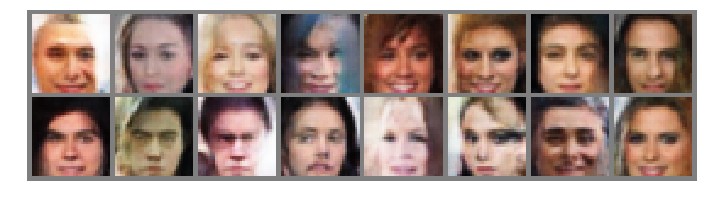

In [26]:
# set number of epochs 

n_epochs = 5
#batch_size = 32
#lr = 0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)


Epoch [    1/   50] | d_loss: 1.3871 | g_loss: 0.6944
Epoch [    1/   50] | d_loss: 0.4500 | g_loss: 1.6888
Epoch [    1/   50] | d_loss: 0.1316 | g_loss: 2.8423
Epoch [    1/   50] | d_loss: 0.0577 | g_loss: 3.6674
Epoch [    1/   50] | d_loss: 0.0307 | g_loss: 4.3227
Epoch [    1/   50] | d_loss: 0.0198 | g_loss: 4.7423
Epoch [    1/   50] | d_loss: 0.0136 | g_loss: 5.0833
Epoch [    1/   50] | d_loss: 0.0094 | g_loss: 5.4143
Epoch [    1/   50] | d_loss: 0.0072 | g_loss: 5.6246
Epoch [    1/   50] | d_loss: 0.0052 | g_loss: 5.9661
Epoch [    1/   50] | d_loss: 0.0043 | g_loss: 6.2490
Epoch [    1/   50] | d_loss: 0.0038 | g_loss: 6.4131
Epoch [    1/   50] | d_loss: 0.0030 | g_loss: 6.6495
Epoch [    1/   50] | d_loss: 0.0026 | g_loss: 6.8288
Epoch [    1/   50] | d_loss: 0.0023 | g_loss: 6.9482


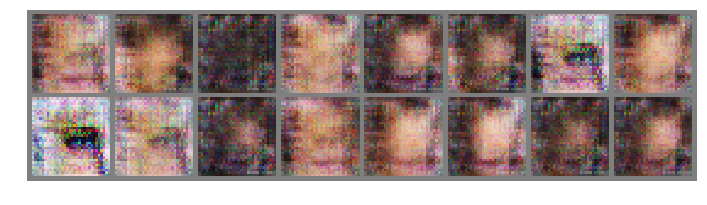

Epoch [    2/   50] | d_loss: 0.0022 | g_loss: 6.9613
Epoch [    2/   50] | d_loss: 0.0020 | g_loss: 6.9827
Epoch [    2/   50] | d_loss: 0.0016 | g_loss: 7.0966
Epoch [    2/   50] | d_loss: 0.0014 | g_loss: 7.2520
Epoch [    2/   50] | d_loss: 0.0012 | g_loss: 7.3860
Epoch [    2/   50] | d_loss: 0.0011 | g_loss: 7.5607
Epoch [    2/   50] | d_loss: 0.0010 | g_loss: 7.6550
Epoch [    2/   50] | d_loss: 0.0010 | g_loss: 7.7668
Epoch [    2/   50] | d_loss: 0.0008 | g_loss: 7.8964
Epoch [    2/   50] | d_loss: 0.0008 | g_loss: 7.9720
Epoch [    2/   50] | d_loss: 0.0007 | g_loss: 8.0358
Epoch [    2/   50] | d_loss: 0.0006 | g_loss: 8.1037
Epoch [    2/   50] | d_loss: 0.0006 | g_loss: 8.1768
Epoch [    2/   50] | d_loss: 0.0005 | g_loss: 8.3071
Epoch [    2/   50] | d_loss: 0.0005 | g_loss: 8.3462


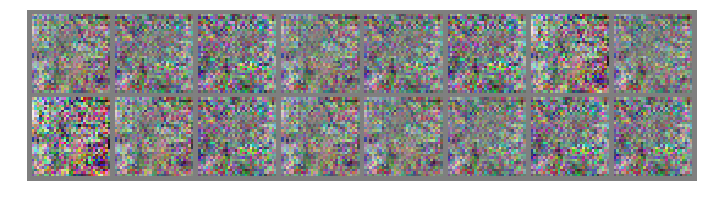

Epoch [    3/   50] | d_loss: 0.0005 | g_loss: 8.3553
Epoch [    3/   50] | d_loss: 0.0004 | g_loss: 8.4599
Epoch [    3/   50] | d_loss: 0.0004 | g_loss: 8.4905
Epoch [    3/   50] | d_loss: 0.0005 | g_loss: 8.6113
Epoch [    3/   50] | d_loss: 0.0004 | g_loss: 8.7402
Epoch [    3/   50] | d_loss: 0.0004 | g_loss: 8.8508
Epoch [    3/   50] | d_loss: 0.0003 | g_loss: 8.9138
Epoch [    3/   50] | d_loss: 0.0003 | g_loss: 8.9717
Epoch [    3/   50] | d_loss: 0.0003 | g_loss: 9.0307
Epoch [    3/   50] | d_loss: 0.0003 | g_loss: 9.0830
Epoch [    3/   50] | d_loss: 0.0002 | g_loss: 9.1121
Epoch [    3/   50] | d_loss: 0.0002 | g_loss: 9.1418
Epoch [    3/   50] | d_loss: 0.0002 | g_loss: 9.1982
Epoch [    3/   50] | d_loss: 0.0002 | g_loss: 9.2681
Epoch [    3/   50] | d_loss: 0.0002 | g_loss: 9.3034


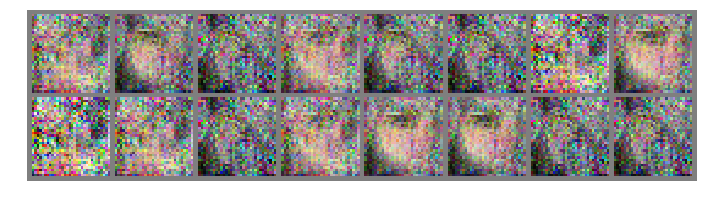

Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.3012
Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.3857
Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.4756
Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.5543
Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.5723
Epoch [    4/   50] | d_loss: 0.0002 | g_loss: 9.5912
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.6904
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.6767
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.6125
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.7041
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.7971
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.8368
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.8860
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 9.9378
Epoch [    4/   50] | d_loss: 0.0001 | g_loss: 10.0235


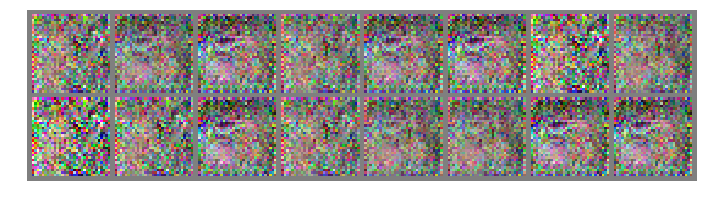

Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.0127
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 9.9486
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.0826
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.1764
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.2311
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.3110
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.3089
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.3514
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.4275
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.4760
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.4922
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.4955
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.5751
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.6094
Epoch [    5/   50] | d_loss: 0.0001 | g_loss: 10.7120


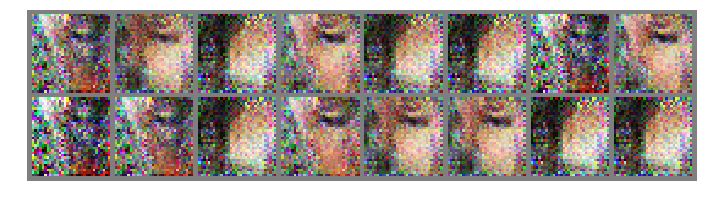

Epoch [    6/   50] | d_loss: 0.0001 | g_loss: 10.7134
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.7341
Epoch [    6/   50] | d_loss: 0.0001 | g_loss: 10.7750
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.7873
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.8665
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.8846
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9240
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9467
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9120
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9268
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9237
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9417
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 10.9447
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 11.0055
Epoch [    6/   50] | d_loss: 0.0000 | g_loss: 11.0919


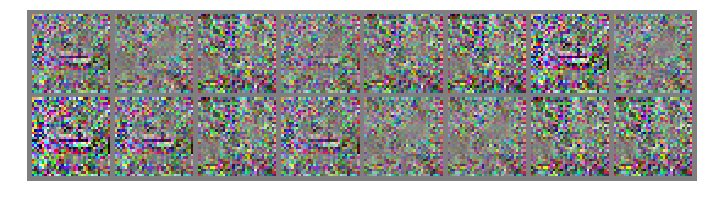

Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.0963
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.1429
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.1879
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.2304
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.2768
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.3104
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.3102
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.3942
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.4468
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.3902
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.4103
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.5329
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.5367
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.6016
Epoch [    7/   50] | d_loss: 0.0000 | g_loss: 11.7144


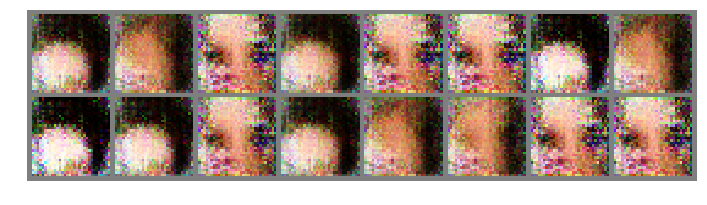

Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.7086
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.7562
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.7828
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.8632
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.8908
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.9255
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.9521
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.9650
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.9776
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 11.9951
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 12.0577
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 12.0674
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 12.0749
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 12.0762
Epoch [    8/   50] | d_loss: 0.0000 | g_loss: 12.0966


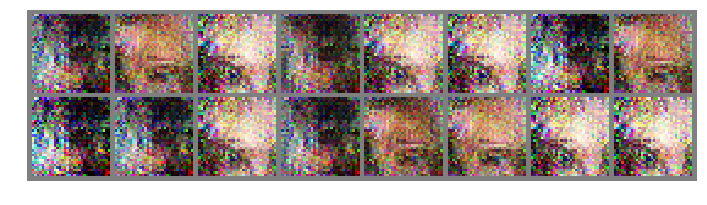

Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.0867
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.0671
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.0305
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.1075
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.1783
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.2241
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.2404
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.2645
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.2946
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.2866
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.3191
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.3377
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.4081
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.4545
Epoch [    9/   50] | d_loss: 0.0000 | g_loss: 12.5127


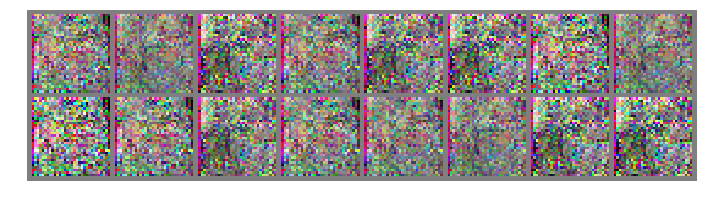

Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.5201
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.5517
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.4266
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.4954
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.6390
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.7338
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.7660
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.7131
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.6887
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.8206
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.9040
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.9676
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 12.9795
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 13.0371
Epoch [   10/   50] | d_loss: 0.0000 | g_loss: 13.0383


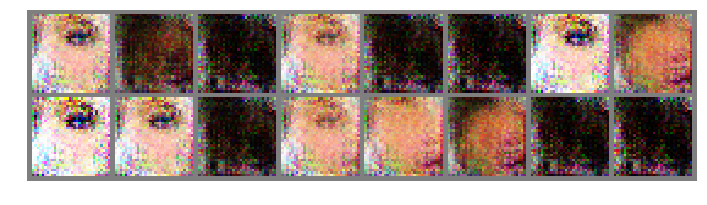

Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.0491
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.0444
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.0941
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.1308
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.1758
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.1987
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2528
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2692
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.3415
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2959
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.3213
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2288
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.0613
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2215
Epoch [   11/   50] | d_loss: 0.0000 | g_loss: 13.2940


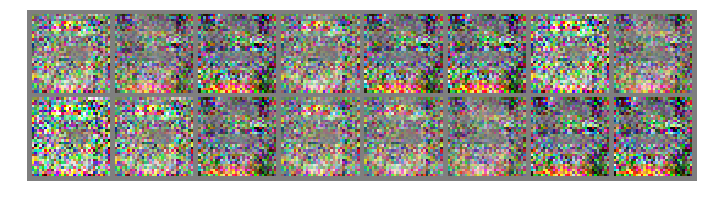

Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.3152
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.3627
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.3370
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.2740
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.2796
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.3853
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.4886
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.6021
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.6502
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7067
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7266
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7407
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7505
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7620
Epoch [   12/   50] | d_loss: 0.0000 | g_loss: 13.7664


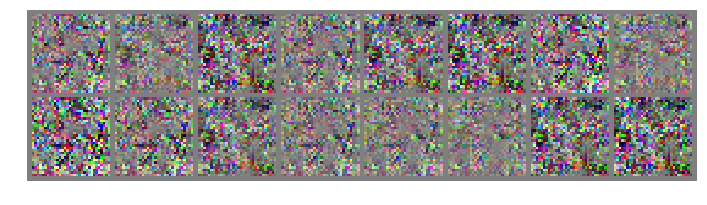

Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.7579
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.7373
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.7363
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.7259
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.7902
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.8081
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.8943
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.9518
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 13.9964
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.0559
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.1416
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.1485
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.1512
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.2046
Epoch [   13/   50] | d_loss: 0.0000 | g_loss: 14.1643


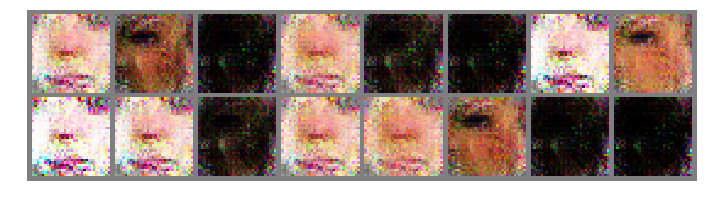

Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.1937
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.2219
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.2954
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.2951
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.3515
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.3545
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.4103
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.4259
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.5113
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.4753
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.5533
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.5540
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.5625
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.5755
Epoch [   14/   50] | d_loss: 0.0000 | g_loss: 14.6184


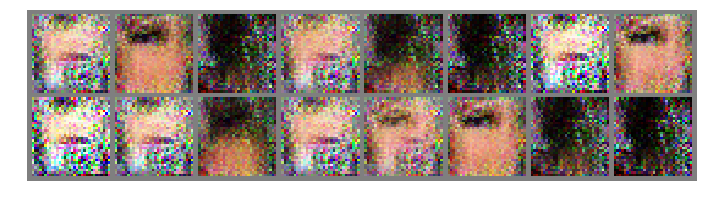

Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.5642
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.6590
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.6620
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.6307
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.6485
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.5895
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.4927
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.4743
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.5038
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.5955
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.6482
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.7161
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.7653
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.8591
Epoch [   15/   50] | d_loss: 0.0000 | g_loss: 14.9002


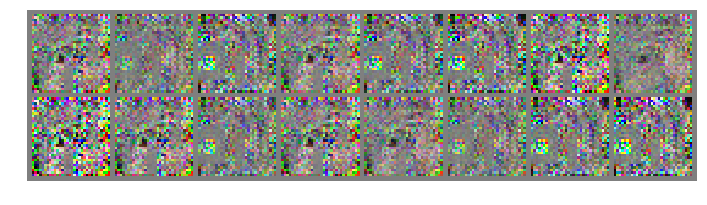

Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 14.8925
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 14.9793
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0282
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0437
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0740
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0700
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0690
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0504
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0492
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0326
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.0481
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.1684
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.3049
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.3653
Epoch [   16/   50] | d_loss: 0.0000 | g_loss: 15.4096


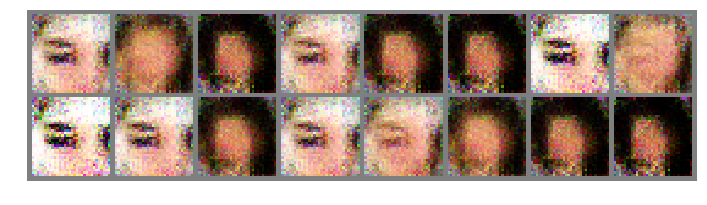

Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.4189
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.4416
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5241
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.4756
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5199
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.4912
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5506
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5228
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5960
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.5905
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.6013
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.6558
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.7298
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.7669
Epoch [   17/   50] | d_loss: 0.0000 | g_loss: 15.7951


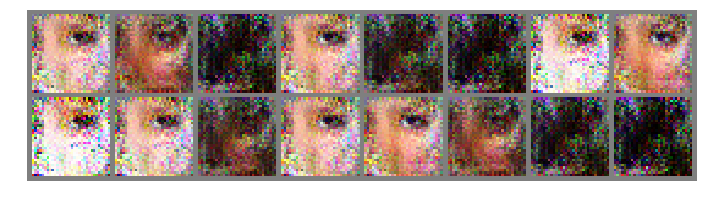

Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8261
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8131
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8603
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8549
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8707
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8305
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.7843
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.7425
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.6769
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.7131
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.7554
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8329
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.8820
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.9458
Epoch [   18/   50] | d_loss: 0.0000 | g_loss: 15.9906


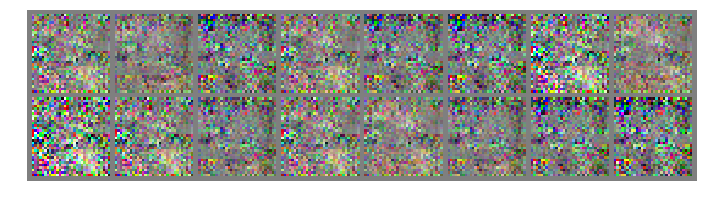

Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 15.9777
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.0085
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.0788
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.1334
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.1673
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.1810
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.1903
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.2268
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.2385
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.2573
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.2728
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.2802
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.3280
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.3337
Epoch [   19/   50] | d_loss: 0.0000 | g_loss: 16.3874


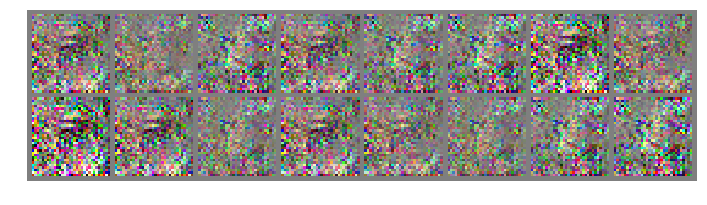

Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.3583
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.3768
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.3961
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.3486
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.3518
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.4446
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.4866
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.4740
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.5329
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.5316
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.5482
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.6160
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.6125
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.6159
Epoch [   20/   50] | d_loss: 0.0000 | g_loss: 16.6391


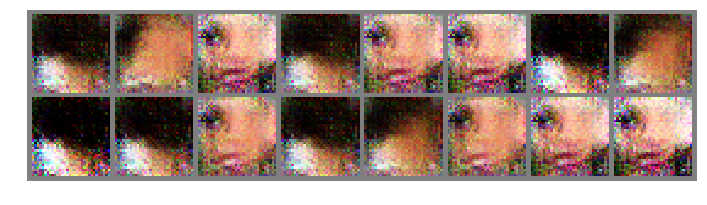

Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6303
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6473
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6360
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6469
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6649
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6441
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6655
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6510
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6676
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6708
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6824
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6566
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6942
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6567
Epoch [   21/   50] | d_loss: 0.0000 | g_loss: 16.6605


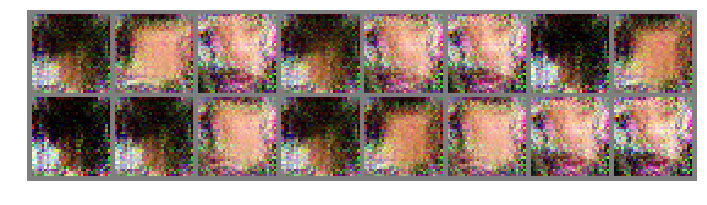

Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.7050
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6564
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6645
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6774
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6530
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6746
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6656
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6556
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6696
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6906
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6524
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.7190
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.7623
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.6823
Epoch [   22/   50] | d_loss: 0.0000 | g_loss: 16.7184


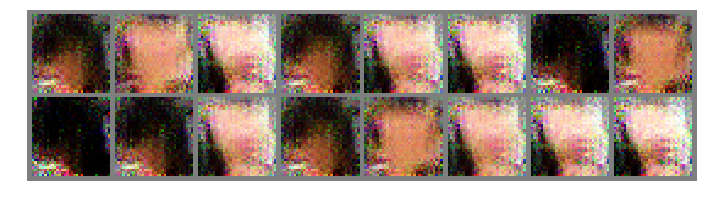

Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7702
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.6933
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7473
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7350
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.6863
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7109
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7403
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.6976
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7605
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7545
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.6667
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7401
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7934
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7595
Epoch [   23/   50] | d_loss: 0.0000 | g_loss: 16.7449


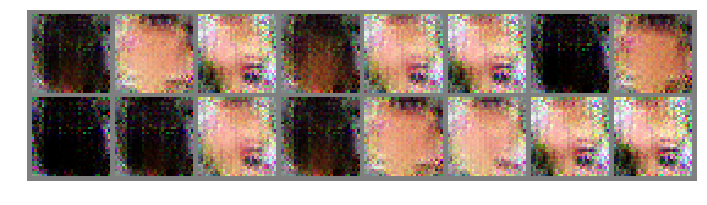

Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.8380
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.8061
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7467
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7089
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7476
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7667
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7636
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7220
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7382
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7440
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.8089
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7907
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7612
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.8871
Epoch [   24/   50] | d_loss: 0.0000 | g_loss: 16.7911


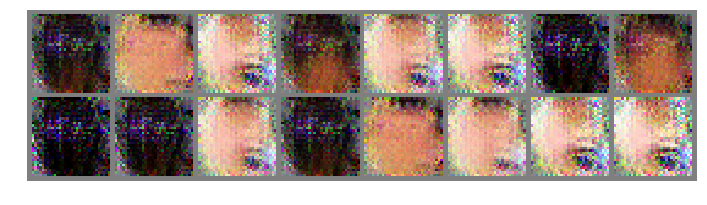

Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.9560
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7561
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7453
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7220
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7348
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7788
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.6959
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7462
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7539
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7463
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7322
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7355
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7493
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7568
Epoch [   25/   50] | d_loss: 0.0000 | g_loss: 16.7693


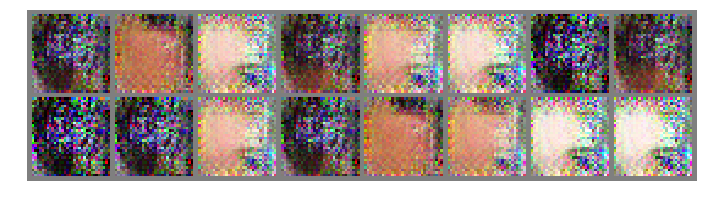

Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.9629
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8171
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8043
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7211
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7624
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8137
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7656
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7375
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7945
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8019
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7911
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7222
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8240
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.7628
Epoch [   26/   50] | d_loss: 0.0000 | g_loss: 16.8003


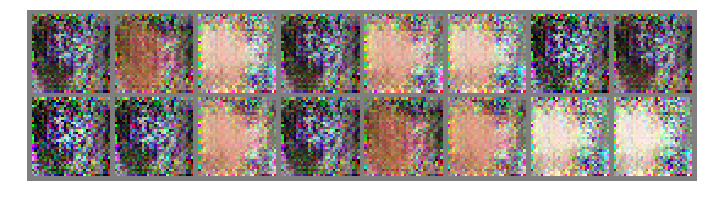

Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.9509
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7622
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7628
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7081
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7345
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7833
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7970
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7461
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.6905
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.8316
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7176
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7524
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7500
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7538
Epoch [   27/   50] | d_loss: 0.0000 | g_loss: 16.7332


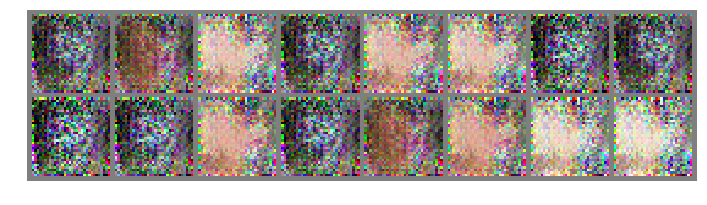

Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.9572
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.8341
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.8200
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.8117
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7572
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.8207
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7666
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7909
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7543
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7539
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7597
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7427
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7860
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7874
Epoch [   28/   50] | d_loss: 0.0000 | g_loss: 16.7619


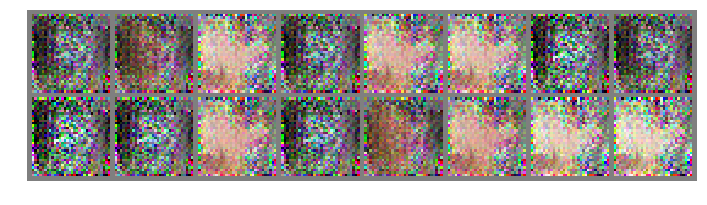

Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 17.0725
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.9818
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.9100
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.8135
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7947
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.8012
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.8005
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7842
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.8596
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7912
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7560
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7806
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7590
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7586
Epoch [   29/   50] | d_loss: 0.0000 | g_loss: 16.7529


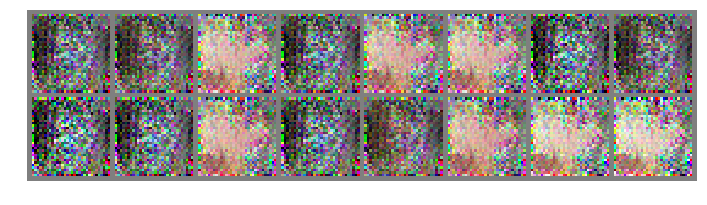

Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 17.1363
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 17.0059
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.9618
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8997
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8617
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8207
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.7817
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.7865
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8355
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8373
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.7922
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.7649
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8423
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8515
Epoch [   30/   50] | d_loss: 0.0000 | g_loss: 16.8390


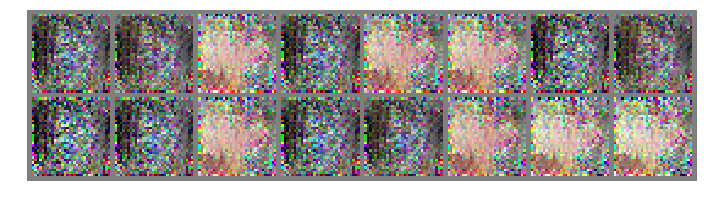

Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 17.2404
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 17.1499
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 17.0725
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 17.0028
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.9950
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.9118
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8747
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8760
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8305
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8488
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8073
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.7841
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8174
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8123
Epoch [   31/   50] | d_loss: 0.0000 | g_loss: 16.8561


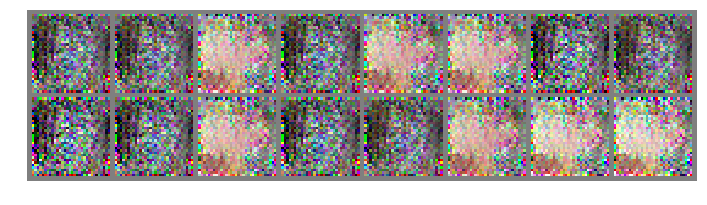

Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.3431
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.2247
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.1768
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.0792
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.0503
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 17.0254
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.9855
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.9393
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.9162
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.9131
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.8799
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.8774
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.8864
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.8717
Epoch [   32/   50] | d_loss: 0.0000 | g_loss: 16.8504


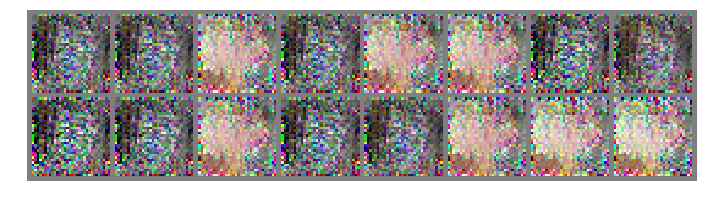

Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.4425
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.3893
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.2396
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.2115
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.1650
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.1145
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0753
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0706
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0490
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0499
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0397
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0605
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0283
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 16.9989
Epoch [   33/   50] | d_loss: 0.0000 | g_loss: 17.0131


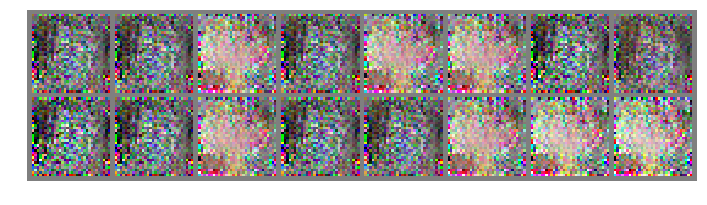

Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.4998
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.3415
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.2686
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.2662
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.2026
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.1849
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.1471
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.1189
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.1376
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0891
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0699
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0938
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0786
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0232
Epoch [   34/   50] | d_loss: 0.0000 | g_loss: 17.0224


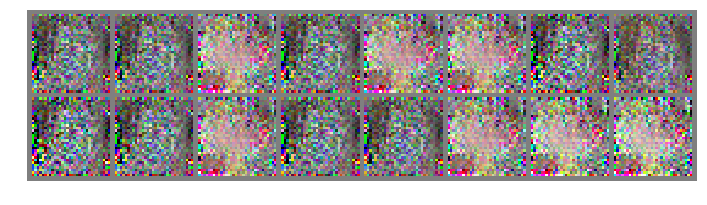

Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.4800
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.3713
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.3311
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.2895
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.2735
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1823
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1719
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1572
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1408
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1144
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1172
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.0981
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.0862
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.1170
Epoch [   35/   50] | d_loss: 0.0000 | g_loss: 17.0932


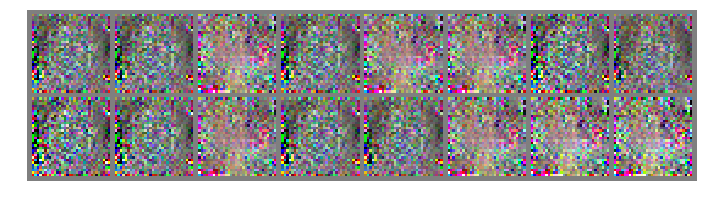

Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.4102
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.3261
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.2953
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.3033
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.2784
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.2149
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.1564
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.0676
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 17.0023
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.9510
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.8770
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.8364
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.8280
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.9030
Epoch [   36/   50] | d_loss: 0.0000 | g_loss: 16.7926


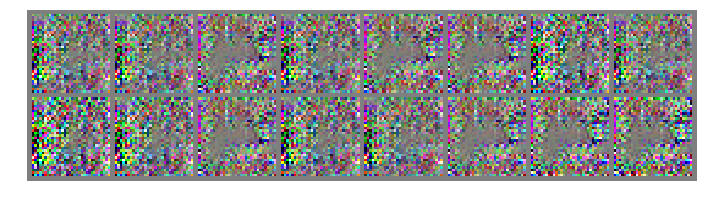

Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 17.2543
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 17.2497
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 17.1845
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 17.0951
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 17.0367
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.9596
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.8901
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.8687
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.7851
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.8482
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.7775
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.9441
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.8441
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.7729
Epoch [   37/   50] | d_loss: 0.0000 | g_loss: 16.8409


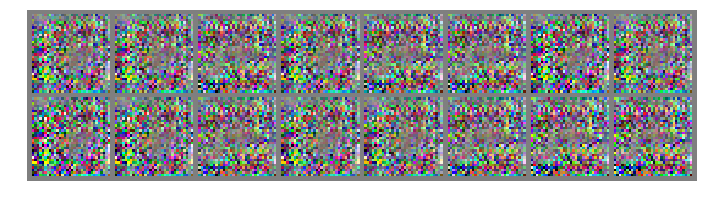

Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.5847
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.5432
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.4316
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.3570
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.2776
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.1953
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.1402
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.0668
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.0139
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 16.9408
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 16.8567
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 16.7928
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 16.8987
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 16.8132
Epoch [   38/   50] | d_loss: 0.0000 | g_loss: 17.0284


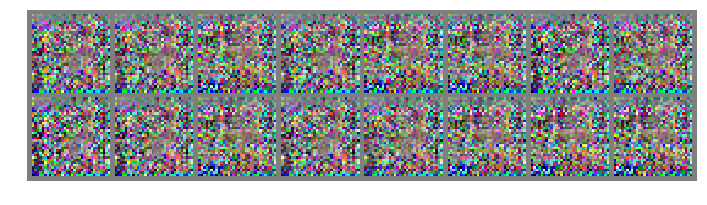

Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 17.9046
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.9832
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 12.9401
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 13.4230
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 13.6161
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 13.9029
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.0388
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.3848
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.4555
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.6003
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.7192
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.6682
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.7987
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.8776
Epoch [   39/   50] | d_loss: 0.0000 | g_loss: 14.8778


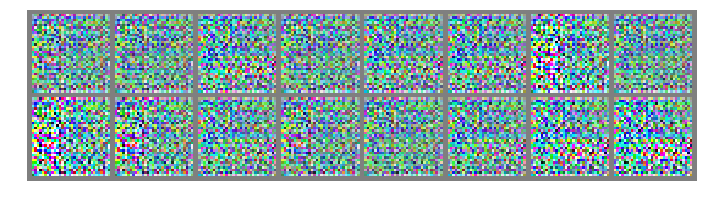

Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 14.9222
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 14.9713
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.0663
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.1383
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.1450
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.2486
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.2521
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.3441
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.4137
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.3438
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.3471
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.5158
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.5670
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.6146
Epoch [   40/   50] | d_loss: 0.0000 | g_loss: 15.7312


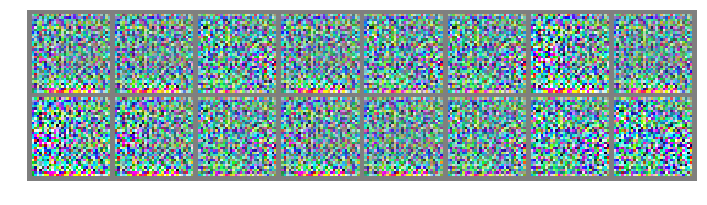

Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 15.6784
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 15.6904
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 15.8114
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 15.9277
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 15.9532
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.0340
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.2107
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.1637
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.2373
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.2666
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.3038
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.4338
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.3818
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.4106
Epoch [   41/   50] | d_loss: 0.0000 | g_loss: 16.4728


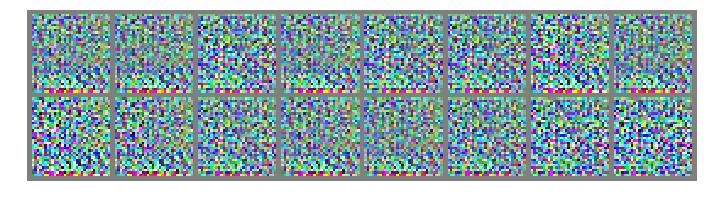

Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.4797
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5313
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5780
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5281
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5758
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5670
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5767
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.5649
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6278
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6353
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6435
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6216
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6895
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6579
Epoch [   42/   50] | d_loss: 0.0000 | g_loss: 16.6860


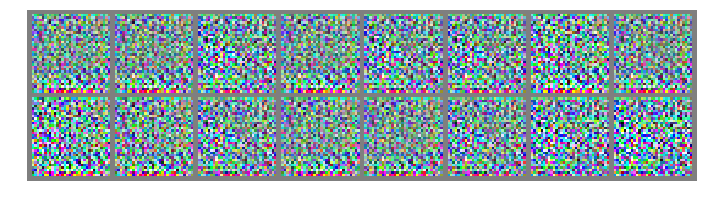

Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7968
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7068
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.6873
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.6661
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.6839
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.6875
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7284
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.6951
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7157
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7332
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7064
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7340
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7335
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.8091
Epoch [   43/   50] | d_loss: 0.0000 | g_loss: 16.7327


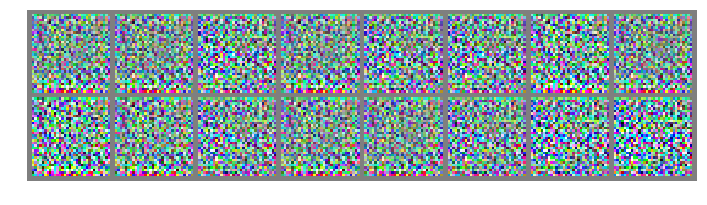

Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7447
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7690
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7588
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7882
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8106
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7664
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8297
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8316
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7968
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7726
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8764
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.7757
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8133
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8577
Epoch [   44/   50] | d_loss: 0.0000 | g_loss: 16.8244


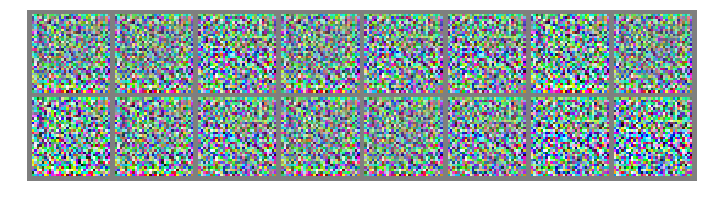

Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.7779
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8275
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.7832
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8742
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8592
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8565
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.9352
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.7906
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8430
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8734
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8170
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.7856
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.7917
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.8316
Epoch [   45/   50] | d_loss: 0.0000 | g_loss: 16.9392


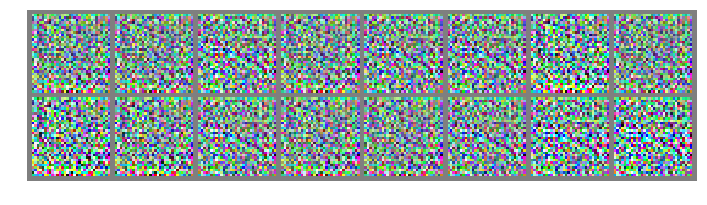

Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8091
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8269
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8336
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8063
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8118
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8497
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.7522
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8376
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8432
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.7704
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8210
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.8244
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.7973
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.7813
Epoch [   46/   50] | d_loss: 0.0000 | g_loss: 16.7699


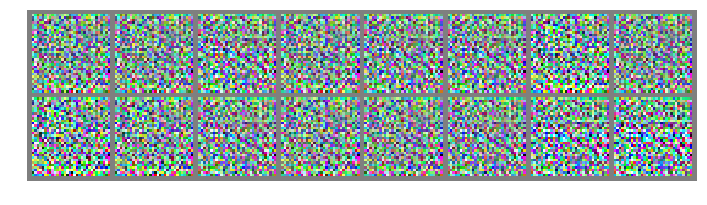

Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8184
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7344
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7651
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7603
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8316
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8042
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7187
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8459
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7491
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7586
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8318
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7326
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.7447
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.8441
Epoch [   47/   50] | d_loss: 0.0000 | g_loss: 16.9006


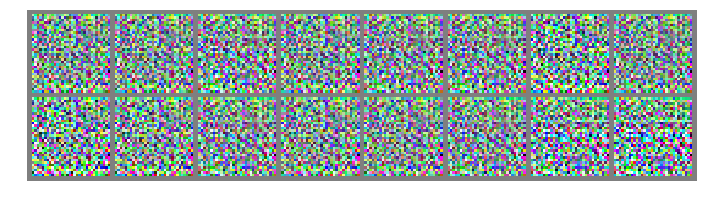

Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8580
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7821
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7947
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8466
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7922
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7960
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8005
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7855
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7803
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.7826
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8675
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8383
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8450
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8793
Epoch [   48/   50] | d_loss: 0.0000 | g_loss: 16.8634


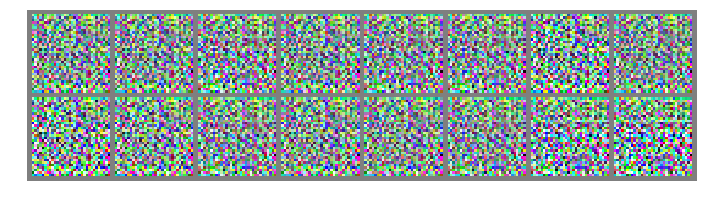

Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.7840
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8288
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8367
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8444
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8432
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8527
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.7706
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8222
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.9247
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8734
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.9158
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.7942
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.7825
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8323
Epoch [   49/   50] | d_loss: 0.0000 | g_loss: 16.8414


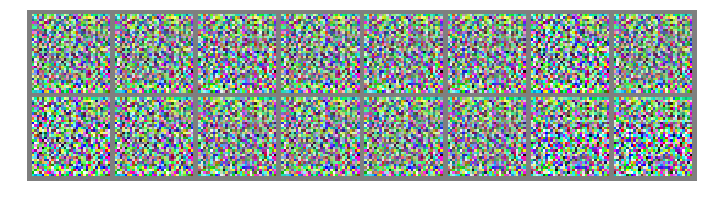

Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.9095
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8282
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8492
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8194
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8884
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8968
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8556
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8572
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.9113
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8948
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.9246
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8831
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8892
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.9633
Epoch [   50/   50] | d_loss: 0.0000 | g_loss: 16.8734


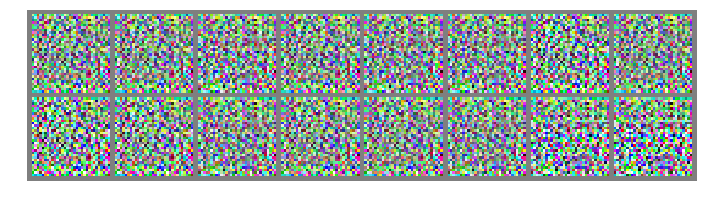

In [46]:
# set number of epochs 
#n_epochs = 100
n_epochs = 50
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

Epoch [    1/    5] | d_loss: 1.3882 | g_loss: 0.6951
Epoch [    1/    5] | d_loss: 0.4720 | g_loss: 1.6765
Epoch [    1/    5] | d_loss: 0.1389 | g_loss: 2.8295
Epoch [    1/    5] | d_loss: 0.0589 | g_loss: 3.6471
Epoch [    1/    5] | d_loss: 0.0328 | g_loss: 4.2560
Epoch [    1/    5] | d_loss: 0.0218 | g_loss: 4.6887
Epoch [    1/    5] | d_loss: 0.0139 | g_loss: 5.1295
Epoch [    1/    5] | d_loss: 0.0099 | g_loss: 5.4239
Epoch [    1/    5] | d_loss: 0.0070 | g_loss: 5.5992
Epoch [    1/    5] | d_loss: 0.0054 | g_loss: 5.9459
Epoch [    1/    5] | d_loss: 0.0043 | g_loss: 6.1474
Epoch [    1/    5] | d_loss: 0.0036 | g_loss: 6.3874
Epoch [    1/    5] | d_loss: 0.0032 | g_loss: 6.6326
Epoch [    1/    5] | d_loss: 0.0029 | g_loss: 6.7401
Epoch [    1/    5] | d_loss: 0.0022 | g_loss: 6.9412


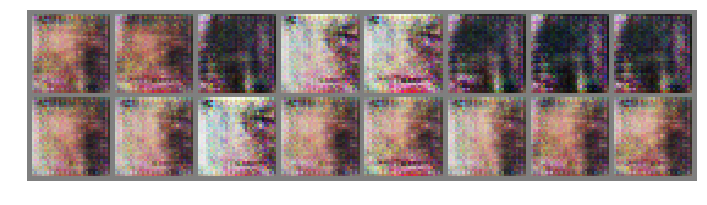

Epoch [    2/    5] | d_loss: 0.0023 | g_loss: 6.9530
Epoch [    2/    5] | d_loss: 0.0019 | g_loss: 6.9932
Epoch [    2/    5] | d_loss: 0.0017 | g_loss: 7.0807
Epoch [    2/    5] | d_loss: 0.0015 | g_loss: 7.2575
Epoch [    2/    5] | d_loss: 0.0013 | g_loss: 7.4473
Epoch [    2/    5] | d_loss: 0.0012 | g_loss: 7.4927
Epoch [    2/    5] | d_loss: 0.0010 | g_loss: 7.6287
Epoch [    2/    5] | d_loss: 0.0009 | g_loss: 7.7679
Epoch [    2/    5] | d_loss: 0.0009 | g_loss: 7.8167
Epoch [    2/    5] | d_loss: 0.0008 | g_loss: 7.9389
Epoch [    2/    5] | d_loss: 0.0007 | g_loss: 8.0240
Epoch [    2/    5] | d_loss: 0.0007 | g_loss: 8.1244
Epoch [    2/    5] | d_loss: 0.0007 | g_loss: 8.2224
Epoch [    2/    5] | d_loss: 0.0005 | g_loss: 8.3690
Epoch [    2/    5] | d_loss: 0.0005 | g_loss: 8.4329


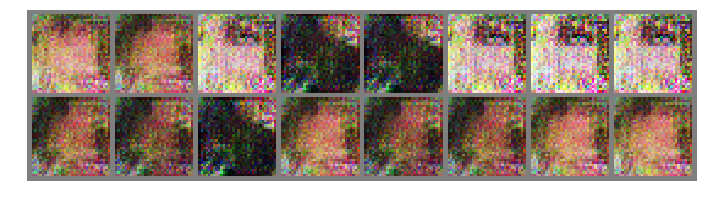

Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.4497
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.5217
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.3998
Epoch [    3/    5] | d_loss: 0.0004 | g_loss: 8.4740
Epoch [    3/    5] | d_loss: 0.0004 | g_loss: 8.5727
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 8.7313
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 8.8183
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 8.9086
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 8.9659
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 8.9970
Epoch [    3/    5] | d_loss: 0.0003 | g_loss: 9.0610
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.0913
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.2203
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.3525
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.4031


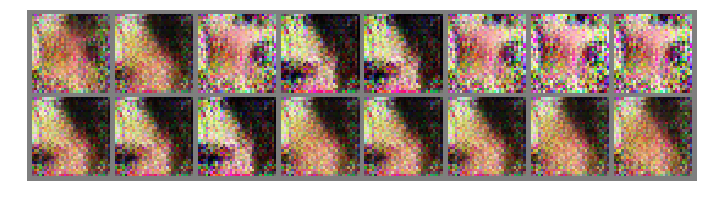

Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.4147
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.4286
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.4108
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.5633
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.6062
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.7109
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.6962
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.6885
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.7945
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.8309
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.6180
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.6906
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.7837
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.8746
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.8826


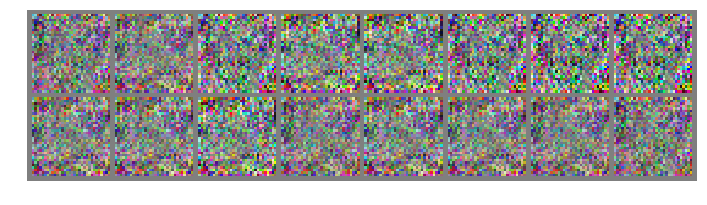

Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.8966
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.9870
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.0818
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.1808
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.2200
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.2276
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.2469
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.3080
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.3116
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.2603
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.4573
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.5572
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.6296
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.5752
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 10.6423


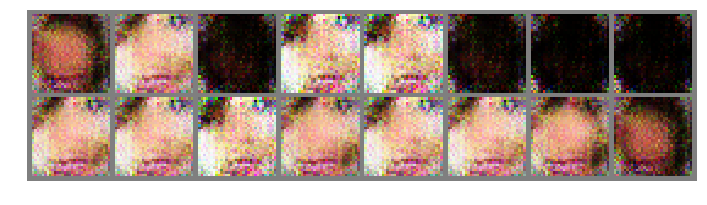

In [21]:
# set number of epochs 
#n_epochs = 100
n_epochs = 5
#n_epochs = 50
# 50 epochs with 
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

In [21]:
# set number of epochs 
#n_epochs = 100
#n_epochs = 50
# 50 epochs with 
#d_conv_dim = 32
#g_conv_dim = 64
#z_sizev= 100

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

Epoch [    1/   50] | d_loss: 1.3827 | g_loss: 0.6938
Epoch [    1/   50] | d_loss: 0.7969 | g_loss: 1.1485
Epoch [    1/   50] | d_loss: 0.3228 | g_loss: 1.9632
Epoch [    1/   50] | d_loss: 0.1382 | g_loss: 2.7610
Epoch [    1/   50] | d_loss: 0.0787 | g_loss: 3.3427
Epoch [    1/   50] | d_loss: 0.0460 | g_loss: 3.8600
Epoch [    1/   50] | d_loss: 0.0295 | g_loss: 4.2517
Epoch [    1/   50] | d_loss: 0.0215 | g_loss: 4.5918
Epoch [    1/   50] | d_loss: 0.0189 | g_loss: 4.7682
Epoch [    1/   50] | d_loss: 0.0137 | g_loss: 5.1107
Epoch [    1/   50] | d_loss: 0.0114 | g_loss: 5.3114
Epoch [    1/   50] | d_loss: 0.0085 | g_loss: 5.5751
Epoch [    1/   50] | d_loss: 0.0071 | g_loss: 5.7195
Epoch [    1/   50] | d_loss: 0.0059 | g_loss: 5.8746
Epoch [    1/   50] | d_loss: 0.0050 | g_loss: 5.9629
Epoch [    2/   50] | d_loss: 0.0049 | g_loss: 5.9666
Epoch [    2/   50] | d_loss: 0.0042 | g_loss: 6.1731
Epoch [    2/   50] | d_loss: 0.0033 | g_loss: 6.3888
Epoch [    2/   50] | d_loss

Epoch [    1/    5] | d_loss: 1.3861 | g_loss: 0.7179
Epoch [    1/    5] | d_loss: 0.1999 | g_loss: 2.6178
Epoch [    1/    5] | d_loss: 0.0532 | g_loss: 3.8153
Epoch [    1/    5] | d_loss: 0.0223 | g_loss: 4.7504
Epoch [    1/    5] | d_loss: 0.0131 | g_loss: 5.1967
Epoch [    1/    5] | d_loss: 0.0080 | g_loss: 5.7412
Epoch [    1/    5] | d_loss: 0.0053 | g_loss: 6.0597
Epoch [    1/    5] | d_loss: 0.0039 | g_loss: 6.2970
Epoch [    1/    5] | d_loss: 0.0029 | g_loss: 6.5877
Epoch [    1/    5] | d_loss: 0.0022 | g_loss: 6.8481
Epoch [    1/    5] | d_loss: 0.0018 | g_loss: 7.0848
Epoch [    1/    5] | d_loss: 0.0018 | g_loss: 7.2983
Epoch [    1/    5] | d_loss: 0.0014 | g_loss: 7.4779
Epoch [    1/    5] | d_loss: 0.0011 | g_loss: 7.6778
Epoch [    1/    5] | d_loss: 0.0010 | g_loss: 7.7832


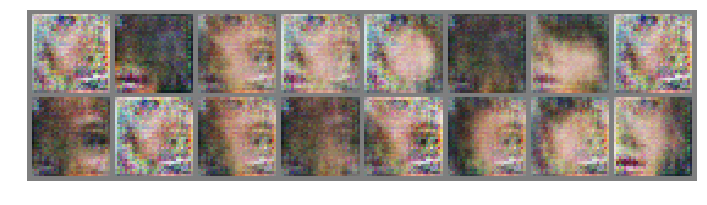

Epoch [    2/    5] | d_loss: 0.0010 | g_loss: 7.7737
Epoch [    2/    5] | d_loss: 0.0009 | g_loss: 7.7472
Epoch [    2/    5] | d_loss: 0.0008 | g_loss: 7.9431
Epoch [    2/    5] | d_loss: 0.0007 | g_loss: 8.0737
Epoch [    2/    5] | d_loss: 0.0006 | g_loss: 8.1806
Epoch [    2/    5] | d_loss: 0.0005 | g_loss: 8.3016
Epoch [    2/    5] | d_loss: 0.0005 | g_loss: 8.4374
Epoch [    2/    5] | d_loss: 0.0004 | g_loss: 8.6479
Epoch [    2/    5] | d_loss: 0.0004 | g_loss: 8.7012
Epoch [    2/    5] | d_loss: 0.0004 | g_loss: 8.8337
Epoch [    2/    5] | d_loss: 0.0004 | g_loss: 8.6850
Epoch [    2/    5] | d_loss: 0.0003 | g_loss: 8.8169
Epoch [    2/    5] | d_loss: 0.0003 | g_loss: 8.9301
Epoch [    2/    5] | d_loss: 0.0002 | g_loss: 9.0573
Epoch [    2/    5] | d_loss: 0.0002 | g_loss: 9.1691


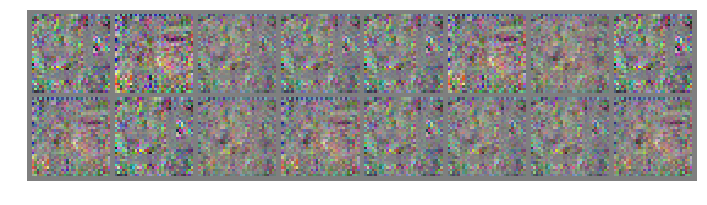

Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.1737
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.2034
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.3192
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.4062
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.4620
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.6274
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.7039
Epoch [    3/    5] | d_loss: 0.0002 | g_loss: 9.7325
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.7954
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.7632
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.8203
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.9009
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.9312
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.9060
Epoch [    3/    5] | d_loss: 0.0001 | g_loss: 9.9571


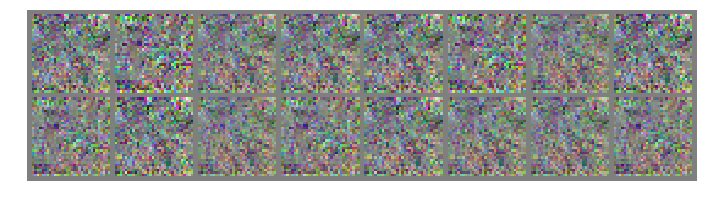

Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 9.9925
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.1274
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.1623
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.1892
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.2886
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.3865
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.4458
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.5290
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.5046
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.5567
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.5911
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.6255
Epoch [    4/    5] | d_loss: 0.0000 | g_loss: 10.6894
Epoch [    4/    5] | d_loss: 0.0001 | g_loss: 10.6572
Epoch [    4/    5] | d_loss: 0.0000 | g_loss: 10.6735


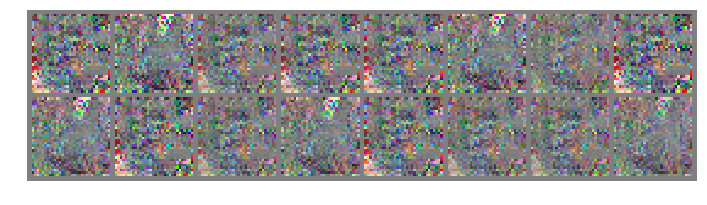

Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.6846
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.7394
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.8073
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.8324
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.9062
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.9153
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 10.9256
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.0584
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.2128
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.2393
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.3248
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.2887
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.3097
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.3967
Epoch [    5/    5] | d_loss: 0.0000 | g_loss: 11.4804


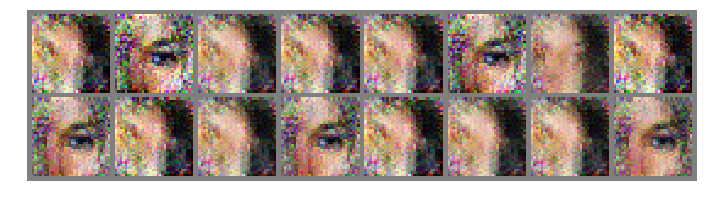

In [21]:
# set number of epochs 
#n_epochs = 100
# 5 epochs with 
#d_conv_dim = 128
#g_conv_dim = 128
#z_sizev= 150
n_epochs = 5


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

Epoch [    1/    5] | d_loss: 1.3873 | g_loss: 0.6939
Epoch [    1/    5] | d_loss: 0.7867 | g_loss: 1.1540
Epoch [    1/    5] | d_loss: 0.3207 | g_loss: 1.9645
Epoch [    1/    5] | d_loss: 0.1401 | g_loss: 2.7451
Epoch [    1/    5] | d_loss: 0.0761 | g_loss: 3.3495
Epoch [    1/    5] | d_loss: 0.0452 | g_loss: 3.8476
Epoch [    1/    5] | d_loss: 0.0317 | g_loss: 4.2222
Epoch [    1/    5] | d_loss: 0.0230 | g_loss: 4.5556
Epoch [    1/    5] | d_loss: 0.0175 | g_loss: 4.7701
Epoch [    1/    5] | d_loss: 0.0131 | g_loss: 5.0755
Epoch [    1/    5] | d_loss: 0.0101 | g_loss: 5.2385
Epoch [    1/    5] | d_loss: 0.0080 | g_loss: 5.5233
Epoch [    1/    5] | d_loss: 0.0067 | g_loss: 5.7209
Epoch [    1/    5] | d_loss: 0.0055 | g_loss: 5.9025
Epoch [    1/    5] | d_loss: 0.0050 | g_loss: 6.0590


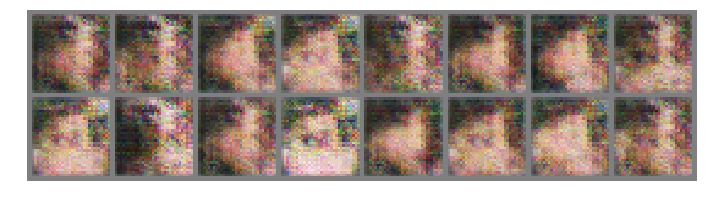

Epoch [    2/    5] | d_loss: 0.0053 | g_loss: 6.0438
Epoch [    2/    5] | d_loss: 0.0043 | g_loss: 6.2672
Epoch [    2/    5] | d_loss: 0.0036 | g_loss: 6.4383
Epoch [    2/    5] | d_loss: 0.0031 | g_loss: 6.5423
Epoch [    2/    5] | d_loss: 0.0028 | g_loss: 6.5882
Epoch [    2/    5] | d_loss: 0.0025 | g_loss: 6.6204
Epoch [    2/    5] | d_loss: 0.0022 | g_loss: 6.7593
Epoch [    2/    5] | d_loss: 0.0020 | g_loss: 6.9167
Epoch [    2/    5] | d_loss: 0.0017 | g_loss: 7.0811
Epoch [    2/    5] | d_loss: 0.0016 | g_loss: 7.1165
Epoch [    2/    5] | d_loss: 0.0014 | g_loss: 7.2109
Epoch [    2/    5] | d_loss: 0.0014 | g_loss: 7.3109
Epoch [    2/    5] | d_loss: 0.0012 | g_loss: 7.4783
Epoch [    2/    5] | d_loss: 0.0012 | g_loss: 7.5405
Epoch [    2/    5] | d_loss: 0.0011 | g_loss: 7.6413


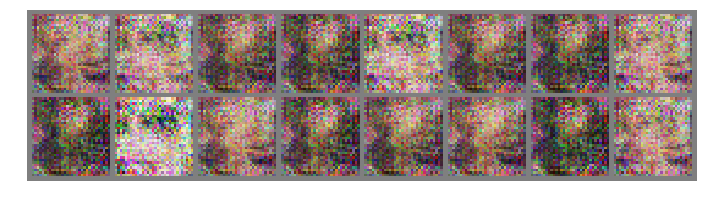

Epoch [    3/    5] | d_loss: 0.0011 | g_loss: 7.6130
Epoch [    3/    5] | d_loss: 0.0010 | g_loss: 7.6610
Epoch [    3/    5] | d_loss: 0.0010 | g_loss: 7.7843
Epoch [    3/    5] | d_loss: 0.0008 | g_loss: 7.7931
Epoch [    3/    5] | d_loss: 0.0008 | g_loss: 7.7422
Epoch [    3/    5] | d_loss: 0.0007 | g_loss: 7.9388
Epoch [    3/    5] | d_loss: 0.0006 | g_loss: 7.9927
Epoch [    3/    5] | d_loss: 0.0006 | g_loss: 8.0640
Epoch [    3/    5] | d_loss: 0.0006 | g_loss: 8.1218
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.2241
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.2991
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.4304
Epoch [    3/    5] | d_loss: 0.0004 | g_loss: 8.5025
Epoch [    3/    5] | d_loss: 0.0005 | g_loss: 8.5288
Epoch [    3/    5] | d_loss: 0.0004 | g_loss: 8.5800


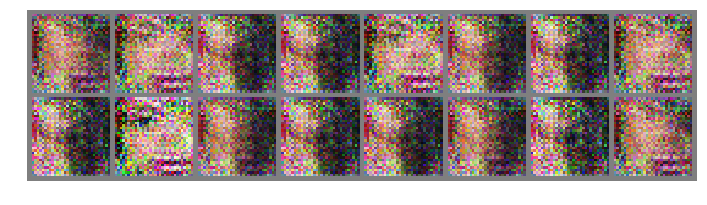

Epoch [    4/    5] | d_loss: 0.0004 | g_loss: 8.5795
Epoch [    4/    5] | d_loss: 0.0004 | g_loss: 8.4928
Epoch [    4/    5] | d_loss: 0.0004 | g_loss: 8.5332
Epoch [    4/    5] | d_loss: 0.0004 | g_loss: 8.5900
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 8.6915
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 8.7388
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 8.8053
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 8.8808
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 8.9501
Epoch [    4/    5] | d_loss: 0.0003 | g_loss: 9.0333
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.0888
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.1743
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.1917
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.2881
Epoch [    4/    5] | d_loss: 0.0002 | g_loss: 9.3311


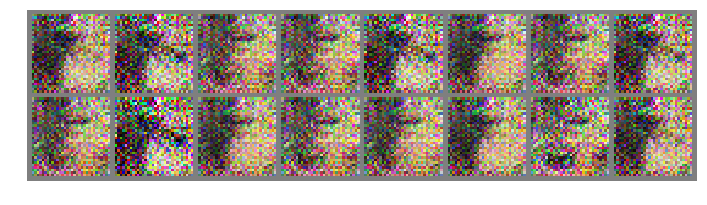

Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.3411
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.3376
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.2317
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.2846
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.3043
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.3767
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.4494
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.5830
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.5413
Epoch [    5/    5] | d_loss: 0.0002 | g_loss: 9.6310
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.7696
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.8127
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.8802
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.9300
Epoch [    5/    5] | d_loss: 0.0001 | g_loss: 9.9575


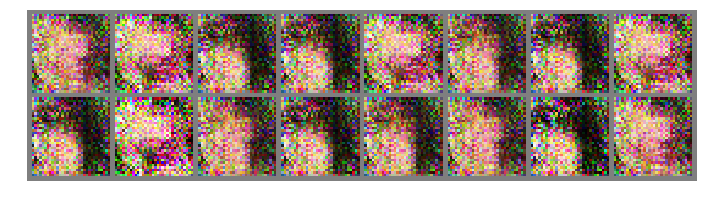

In [21]:
# set number of epochs 
#n_epochs = 100
#n_epochs = 5
# 50 epochs with 
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

## Training loss

Plot the training losses for the generator and discriminator, recorded after each epoch.

In [ ]:
#######################
## This is the best result that I got, it occurs with the hyperparameter values that are listed.
# 25 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

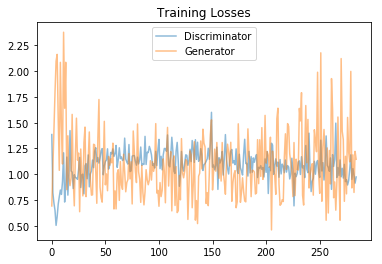

In [27]:
#######################
## This is the best result that I got, it occurs with the hyperparameter values that are listed.
# 5 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

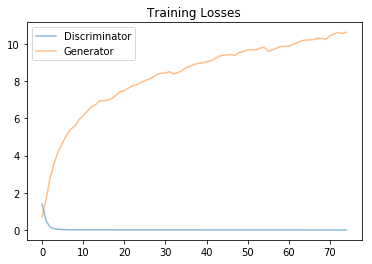

In [22]:
# 5 epochs
# 5 epochs with 
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

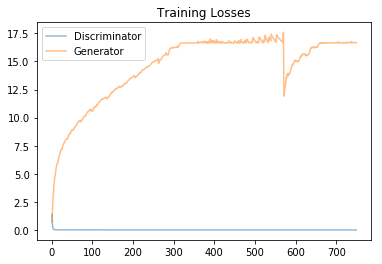

In [22]:
# 50 epochs
# 50 epochs with 
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

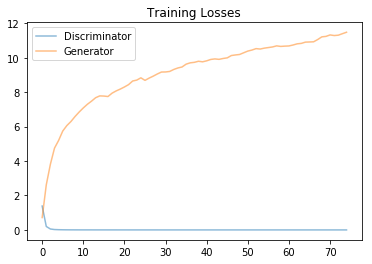

In [22]:
# 5 epochs with 
#d_conv_dim = 128
#g_conv_dim = 128
#z_sizev= 150

fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

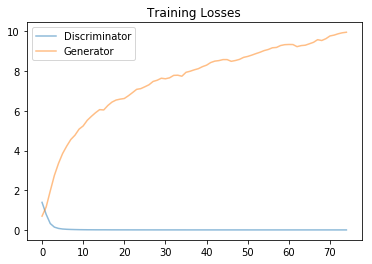

In [22]:
# 5 epochs with 
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

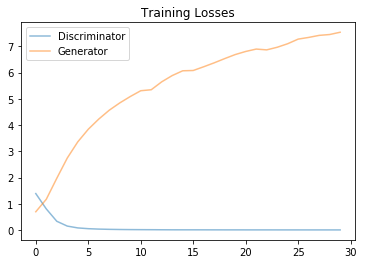

In [23]:
# Only 2 epochs
# 2 epochs with 
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100

fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

## Generator samples from training

View samples of images from the generator, and answer a question about the strengths and weaknesses of your trained models.

In [28]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))

In [29]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

In [ ]:
# 25 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
_ = view_samples(-1, samples)

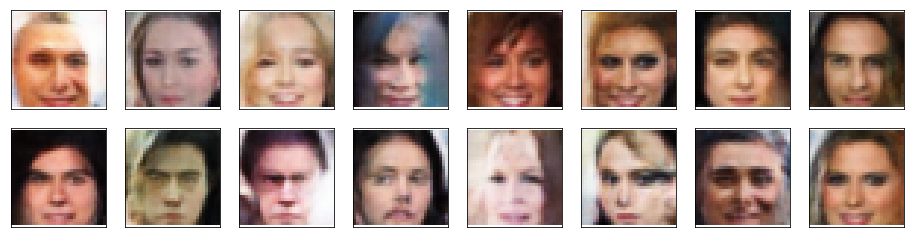

In [30]:
# 5 epochs
# batch_size = 32
#lr =0.0001
#beta1 = 0.1
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
_ = view_samples(-1, samples)

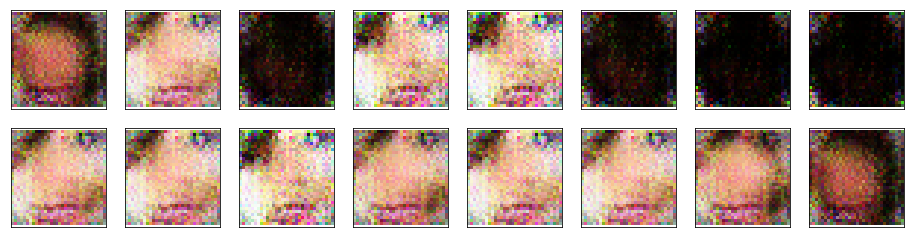

In [25]:
#5 epochs
#d_conv_dim = 64
#g_conv_dim = 64
#z_sizev= 150
_ = view_samples(-1, samples)

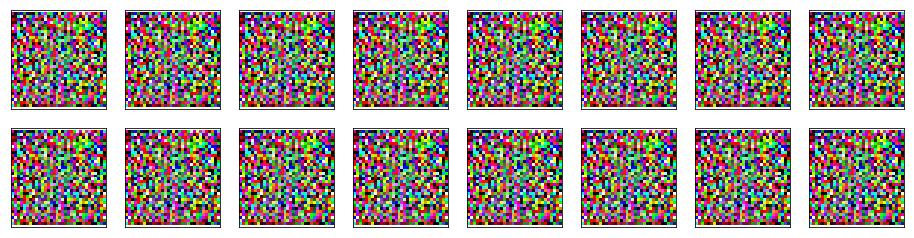

In [26]:
#50 epochs
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100
_ = view_samples(-1, samples)

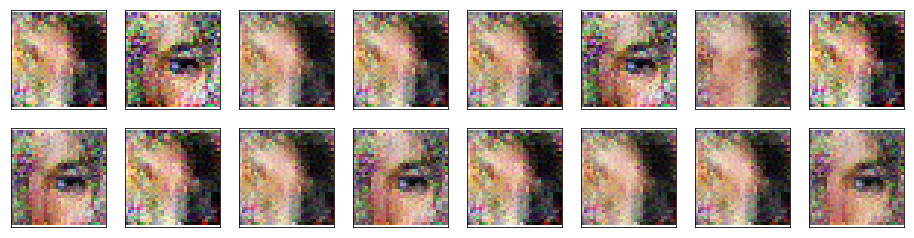

In [25]:
#50 epochs NEW PARAMETERS
#d_conv_dim = 128
#g_conv_dim = 128
#z_sizev= 150
_ = view_samples(-1, samples)

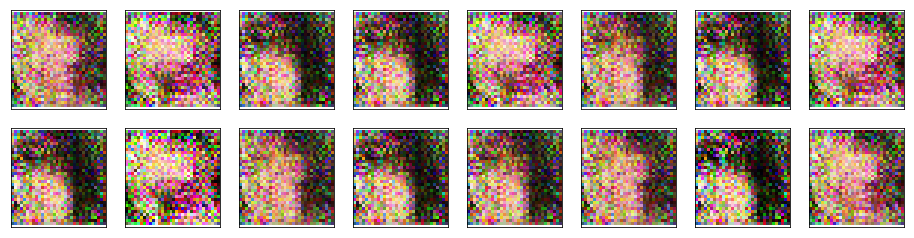

In [26]:
#5 epochs
#d_conv_dim = 32
#g_conv_dim = 32
#z_sizev= 100
_ = view_samples(-1, samples)

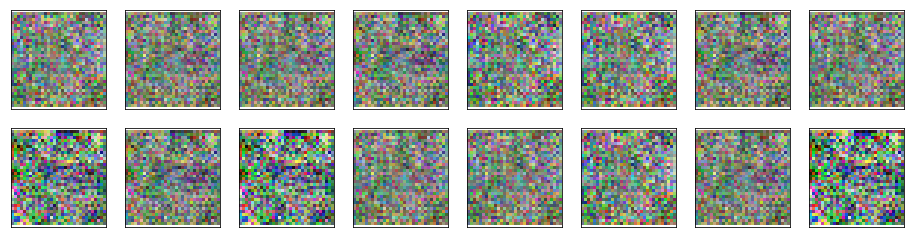

In [26]:
# This was the first testing, only 2 epochs to see what happens and it is so interesting to see this. 
# This is how it starts the learning, just a bunch of pixels.

_ = view_samples(-1, samples)

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result


**Answer:** 
It makes sense to me to expand the dataset with pictures of people of all age groups, ethnicities, and races. When we increase the size of the dataset we need more computer power to process large amounts of data and use of parallel computing, increasing the num_workers to more than zero. For me, in image generation,CDGANs are the most adequate architecture. In terms of optimizers, so far my experience is that Adam Optimizer is one of the faster optimizers but nothing is set on stone. Definitely the optimization strategy depends on more than the optimizer choice. Our CDGAN example in the classroom is trained for 100 epochs. I tested with 1 epoch and I could only get blurry images. That made me wonder if in CDGAN the number of epochs for training need to be larger than in CNNs or RNNs.But after all the experiments, I actually didn't need 100 epochs. I believe that this was like the CNN that the number of epochs give me a higher accuracy if I have the right architecture with the adequate hyperparameter values but it doesn't work like that. I learned that in the CDGAN the optimization strategy includes findin a balance between the discriminator loss and the generator loss and that heavily depends on the architecture of both networks. In the beginning I wasn't using dropout in any network and in the beginning I wasn't generating images even increasing the number of epochs. I thought my networks were not learning properly so I decreased the learning rate, reduced the batch size, added dropout to both networks, and increased the number of convolutional layers from 32 to 64 and finally I could generate images. I could also see the balance between the discriminator and generator losses when the model was finally generating images, then I increased my number of epochs from 5 to 25 to see if the images generated will be even more realistic
with a higher number of epochs. I believe that once I had a good architecture, a good learning rate, and appropriate values for hyperparameters training from 5 epochs to 25 epochs was worthy but I have a feeling that doing it for 50 or 100 epochs is not going to improve the results.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "problem_unittests.py" files in your submission.